# Recomendación Musical con características numéricas y procesamiento de lenguaje natural

In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns
import plotly.express as px
import warnings
import joblib
from googletrans import Translator
import random
import torch
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report 
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.decomposition import PCA
from transformers import DistilBertForSequenceClassification, DistilBertTokenizer
warnings.filterwarnings(action = "ignore")
mentalMusicData = pd.read_csv('mxmh_survey_results.csv')
musicFeatureData = pd.read_csv('spotify_songs.csv')
musicLyricsData = pd.read_csv('tcc_ceds_music.csv')


Analisis del dataset Music & Mental Health Survey Results

In [92]:
print(mentalMusicData.shape)
mentalMusicData.head()



(736, 33)


,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
2,8/27/2022 21:28:18,18.0,Spotify,4.0,No,No,No,Video game music,No,Yes,...,Never,Rarely,Rarely,Very frequently,7.0,7.0,10.0,2.0,No effect,I understand.
3,8/27/2022 21:40:40,61.0,YouTube Music,2.5,Yes,No,Yes,Jazz,Yes,Yes,...,Sometimes,Never,Never,Never,9.0,7.0,3.0,3.0,Improve,I understand.
4,8/27/2022 21:54:47,18.0,Spotify,4.0,Yes,No,No,R&B,Yes,No,...,Very frequently,Very frequently,Never,Rarely,7.0,2.0,5.0,9.0,Improve,I understand.


In [93]:
mentalMusicData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Timestamp                     736 non-null    object 
 1   Age                           735 non-null    float64
 2   Primary streaming service     735 non-null    object 
 3   Hours per day                 736 non-null    float64
 4   While working                 733 non-null    object 
 5   Instrumentalist               732 non-null    object 
 6   Composer                      735 non-null    object 
 7   Fav genre                     736 non-null    object 
 8   Exploratory                   736 non-null    object 
 9   Foreign languages             732 non-null    object 
 10  BPM                           629 non-null    float64
 11  Frequency [Classical]         736 non-null    object 
 12  Frequency [Country]           736 non-null    object 
 13  Frequ

In [94]:
print(mentalMusicData.isnull().sum())

Timestamp                         0
Age                               1
Primary streaming service         1
Hours per day                     0
While working                     3
Instrumentalist                   4
Composer                          1
Fav genre                         0
Exploratory                       0
Foreign languages                 4
BPM                             107
Frequency [Classical]             0
Frequency [Country]               0
Frequency [EDM]                   0
Frequency [Folk]                  0
Frequency [Gospel]                0
Frequency [Hip hop]               0
Frequency [Jazz]                  0
Frequency [K pop]                 0
Frequency [Latin]                 0
Frequency [Lofi]                  0
Frequency [Metal]                 0
Frequency [Pop]                   0
Frequency [R&B]                   0
Frequency [Rap]                   0
Frequency [Rock]                  0
Frequency [Video game music]      0
Anxiety                     

In [95]:
mentalMusicData[mentalMusicData['Age'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
12,8/27/2022 23:04:00,NaN,Spotify,3.0,Yes,No,No,Hip hop,Yes,Yes,...,Sometimes,Rarely,Rarely,Never,9.0,3.0,2.0,7.0,Improve,I understand.


In [96]:
mentalMusicData[mentalMusicData['Primary streaming service'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
197,8/28/2022 20:50:37,21.0,NaN,5.0,Yes,No,No,Country,Yes,No,...,Never,Rarely,Very frequently,Never,9.0,8.0,9.0,7.0,Improve,I understand.


In [97]:
mentalMusicData[mentalMusicData['Instrumentalist'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
223,8/28/2022 22:06:46,18.0,YouTube Music,12.0,Yes,NaN,No,K pop,Yes,Yes,...,Sometimes,Sometimes,Rarely,Never,3.0,7.0,5.0,2.0,Improve,I understand.
408,8/29/2022 23:36:14,13.0,YouTube Music,3.0,Yes,NaN,Yes,Classical,No,No,...,Never,Never,Never,Never,8.0,7.0,9.0,2.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.
572,9/4/2022 21:29:06,18.0,Spotify,3.0,Yes,NaN,No,Video game music,Yes,Yes,...,Sometimes,Never,Never,Very frequently,7.0,0.0,3.0,1.0,No effect,I understand.


In [98]:
mentalMusicData[mentalMusicData['Composer'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [99]:
mentalMusicData[mentalMusicData['Foreign languages'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
235,8/28/2022 22:39:58,31.0,Spotify,2.0,No,Yes,No,Metal,Yes,NaN,...,Rarely,Sometimes,Very frequently,Sometimes,7.0,6.0,6.0,5.0,Improve,I understand.
396,8/29/2022 20:03:04,14.0,YouTube Music,1.5,No,Yes,No,Classical,Yes,NaN,...,Never,Never,Rarely,Sometimes,1.0,2.0,4.0,3.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.
666,9/15/2022 0:33:58,15.0,Spotify,3.0,Yes,Yes,No,Rock,No,NaN,...,Never,Never,Very frequently,Rarely,4.0,3.0,5.0,0.0,No effect,I understand.


In [100]:
mentalMusicData[mentalMusicData['BPM'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
10,8/27/2022 22:51:15,18.0,Spotify,3.0,Yes,Yes,No,Country,Yes,No,...,Rarely,Never,Rarely,Never,7.0,7.0,4.0,7.0,No effect,I understand.
12,8/27/2022 23:04:00,NaN,Spotify,3.0,Yes,No,No,Hip hop,Yes,Yes,...,Sometimes,Rarely,Rarely,Never,9.0,3.0,2.0,7.0,Improve,I understand.
15,8/27/2022 23:19:52,17.0,Spotify,2.0,No,No,No,Pop,Yes,Yes,...,Rarely,Sometimes,Sometimes,Rarely,7.0,5.0,4.0,1.0,Worsen,I understand.
30,8/28/2022 10:30:22,20.0,Apple Music,5.0,Yes,Yes,No,Rock,Yes,Yes,...,Sometimes,Sometimes,Very frequently,Rarely,7.0,7.0,2.0,0.0,Improve,I understand.
32,8/28/2022 10:54:30,19.0,Spotify,6.0,Yes,Yes,No,Metal,Yes,Yes,...,Never,Never,Sometimes,Sometimes,9.0,8.0,2.0,3.0,Improve,I understand.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
688,9/24/2022 0:42:39,18.0,Spotify,4.0,Yes,No,No,R&B,No,No,...,Very frequently,Sometimes,Never,Never,8.0,0.0,0.0,2.0,No effect,I understand.
700,10/3/2022 10:00:01,20.0,YouTube Music,1.0,Yes,No,No,Pop,No,Yes,...,Rarely,Sometimes,Rarely,Very frequently,8.0,9.0,6.0,5.0,Worsen,I understand.
706,10/3/2022 15:38:19,23.0,Spotify,1.0,Yes,Yes,No,Rock,Yes,Yes,...,Sometimes,Sometimes,Very frequently,Very frequently,8.0,6.0,1.0,4.0,Improve,I understand.
712,10/4/2022 8:53:39,23.0,I do not use a streaming service.,3.0,Yes,No,No,Rock,No,No,...,Rarely,Never,Very frequently,Never,10.0,5.0,2.0,0.0,Improve,I understand.


In [101]:
mentalMusicData[mentalMusicData['Music effects'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
161,8/28/2022 18:59:40,18.0,Other streaming service,2.0,Yes,No,No,K pop,No,Yes,...,Sometimes,Never,Never,Never,0.0,2.0,0.0,0.0,NaN,I understand.
168,8/28/2022 19:16:43,19.0,Spotify,3.0,Yes,Yes,No,K pop,Yes,Yes,...,Sometimes,Rarely,Sometimes,Sometimes,8.0,9.0,6.0,0.0,NaN,I understand.
338,8/29/2022 8:28:46,21.0,YouTube Music,2.0,Yes,No,No,EDM,No,Yes,...,Rarely,Rarely,Sometimes,Very frequently,10.0,10.0,5.0,7.0,NaN,I understand.
441,8/31/2022 18:56:31,21.0,Apple Music,1.5,Yes,Yes,No,Folk,No,No,...,Never,Never,Sometimes,Never,3.0,3.0,1.0,0.0,NaN,I understand.
532,9/2/2022 19:20:33,67.0,I do not use a streaming service.,1.0,No,No,No,Rock,No,No,...,Sometimes,Sometimes,Sometimes,Never,3.0,2.0,2.0,2.0,NaN,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [102]:
mentalMusicData['Age'].fillna(mentalMusicData['Age'].median(), inplace=True)
mentalMusicData['Primary streaming service'].fillna('Unknown', inplace=True)
mentalMusicData['While working'].fillna('Unknown', inplace=True)
mentalMusicData['Instrumentalist'].fillna('Unknown', inplace=True)
mentalMusicData['Composer'].fillna('Unknown', inplace=True)
mentalMusicData['Foreign languages'].fillna('Unknown', inplace=True)
mentalMusicData['BPM'].fillna(mentalMusicData['BPM'].median(), inplace=True)
mentalMusicData['Music effects'].fillna('Unknown', inplace=True)

In [103]:
print('Number of duplicated rows: ' , len(mentalMusicData[mentalMusicData.duplicated()]))

Number of duplicated rows:  0


In [104]:
#Distribucion
for i in mentalMusicData.select_dtypes(include = "number").columns:
    fig = px.histogram(mentalMusicData, x = i)
    fig.show()

In [105]:
#Outliers
for i in mentalMusicData.select_dtypes(include = "number").columns:
    fig = px.box(mentalMusicData, x = i)
    fig.show()

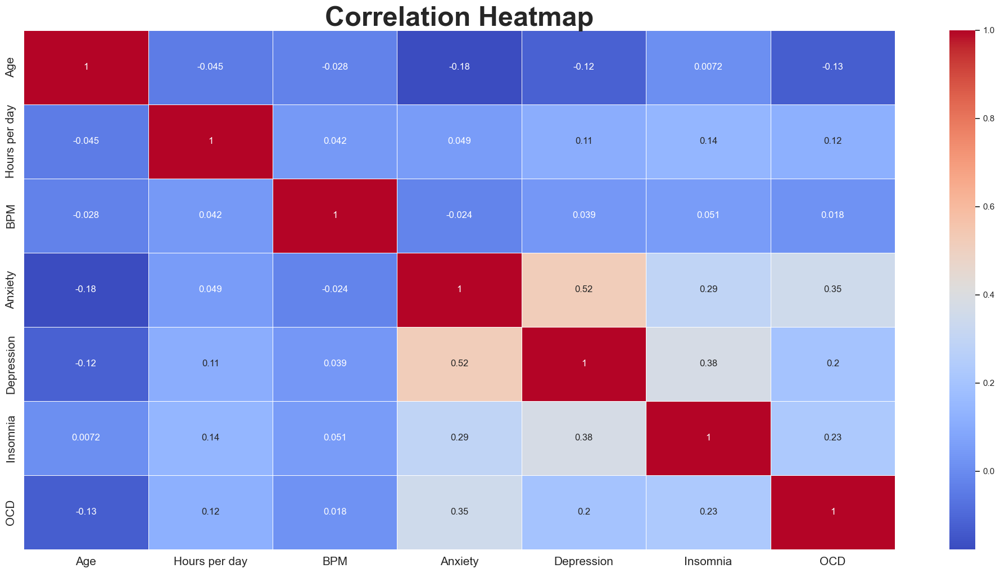

In [106]:
sns.set(rc = {'figure.figsize' : (25, 12)})
s = mentalMusicData.select_dtypes(include = "number").corr()  
sns.heatmap(s, annot = True, cmap = 'coolwarm', linewidth = 0.5)
plt.title("Correlation Heatmap", fontsize = 35, fontweight = "bold")
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
fig.show()

In [107]:
unique = mentalMusicData.nunique().sort_values()
unique_values = mentalMusicData.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
Age,61,"[18.0, 63.0, 61.0, 21.0, 19.0, 17.0, 16.0, 15...."
Anxiety,12,"[3.0, 7.0, 9.0, 8.0, 4.0, 5.0, 2.0, 1.0, 6.0, ..."
BPM,135,"[156.0, 119.0, 132.0, 84.0, 107.0, 86.0, 66.0,..."
Composer,3,"[Yes, No, Unknown]"
Depression,12,"[0.0, 2.0, 7.0, 8.0, 3.0, 1.0, 4.0, 5.0, 9.0, ..."
Exploratory,2,"[Yes, No]"
Fav genre,16,"[Latin, Rock, Video game music, Jazz, R&B, K p..."
Foreign languages,3,"[Yes, No, Unknown]"
Frequency [Classical],4,"[Rarely, Sometimes, Never, Very frequently]"
Frequency [Country],4,"[Never, Sometimes, Very frequently, Rarely]"


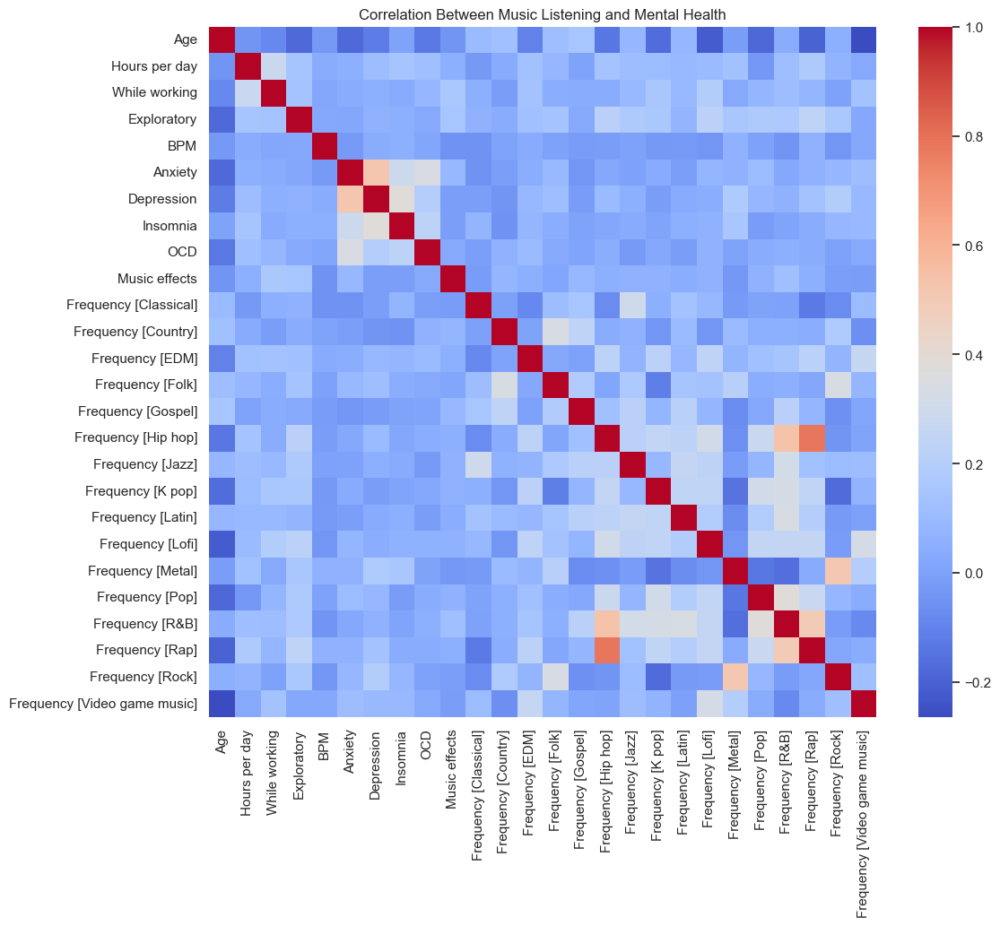

In [108]:
sel = ['Age', 'Hours per day', 'While working', 'Exploratory', 'BPM','Anxiety', 'Depression', 'Insomnia', 'OCD', 'Music effects']
freq = {'Never': 0, 'Rarely': 1, 'Sometimes': 2, 'Very frequently': 3}
df_genre = mentalMusicData[[col for col in mentalMusicData.columns if col.startswith('Frequency')]]
df_genre.replace(freq, inplace=True)
df_sel = pd.concat([mentalMusicData[sel], df_genre], axis=1)
df_sel['While working'] = df_sel['While working'].map({'Yes': 1, 'No': 0})
df_sel['Exploratory'] = df_sel['Exploratory'].map({'Yes': 1, 'No': 0})
df_sel['Music effects'] = df_sel['Music effects'].map({'Improve': 1, 'No effect': 0, 'Worsen': -1})
plt.figure(figsize=(12, 10))
sns.heatmap(df_sel.corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Between Music Listening and Mental Health')
plt.show()

Este mapa de calor no nos brinda información acerca de como la musica y sus generos pueden influir en el estado de animo de las personas.

In [109]:
most = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']

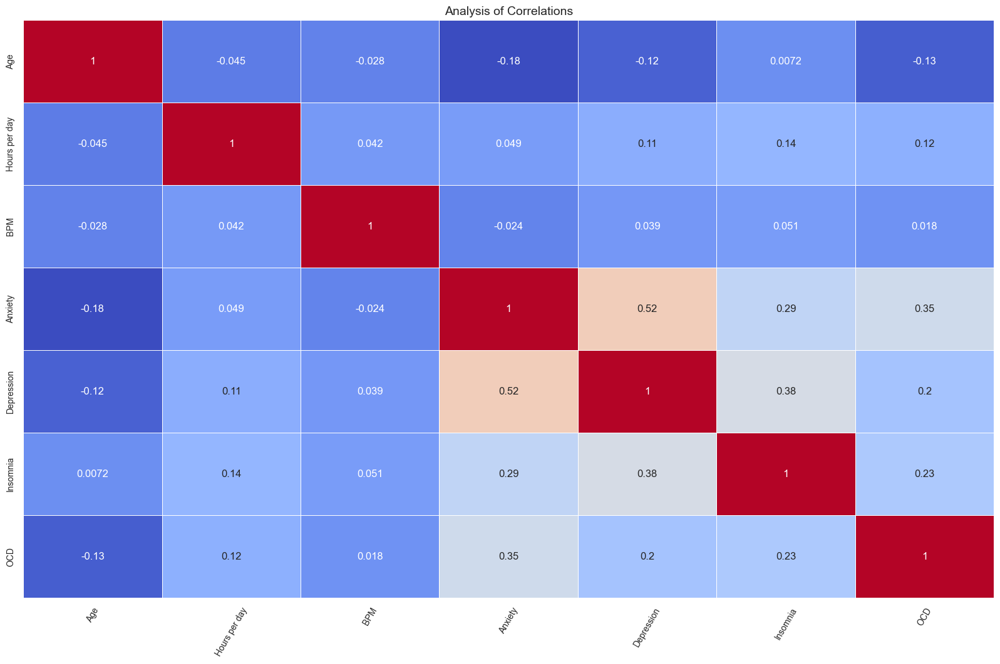

In [110]:
def correlated_map(dataframe, plot=False):
    corr = mentalMusicData[most].corr()
    if plot:
        sns.set(rc={'figure.figsize': (20, 12)})
        sns.heatmap(corr, cmap="coolwarm", annot=True, linewidths=.6 , cbar = False)
        plt.xticks(rotation=60, size=10)
        plt.yticks(size=10)
        plt.title('Analysis of Correlations', size=14)
        plt.show()
correlated_map(mentalMusicData, plot=True)

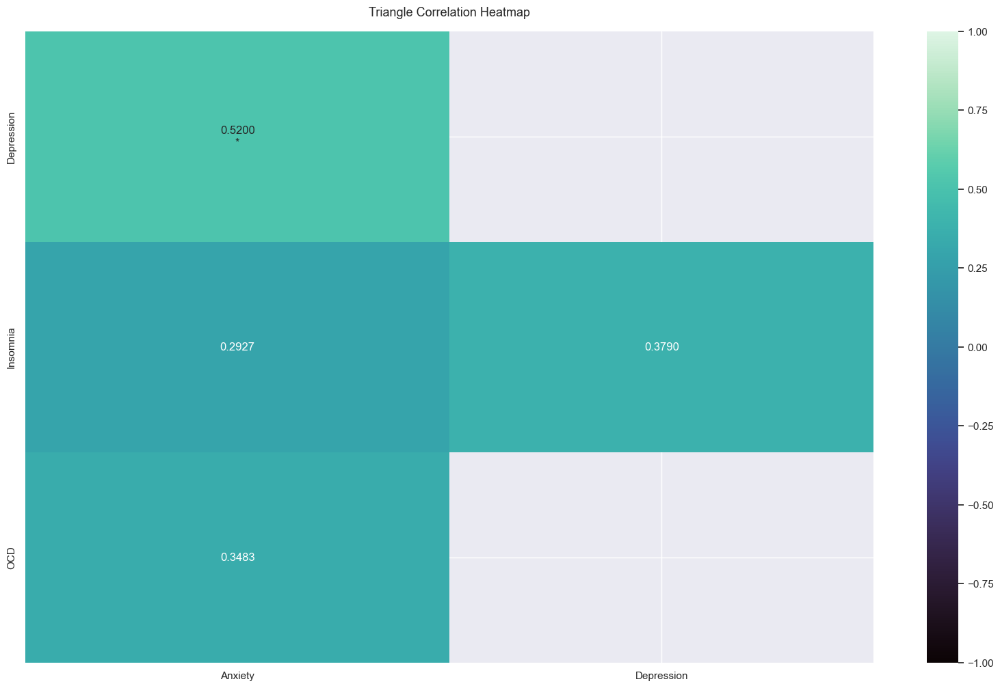

In [111]:
corr = mentalMusicData[most].corr()
f, ax = plt.subplots(figsize=(20, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
          for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='mako')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 13}, pad=16)
plt.show()


Depresion VS columnas de interes

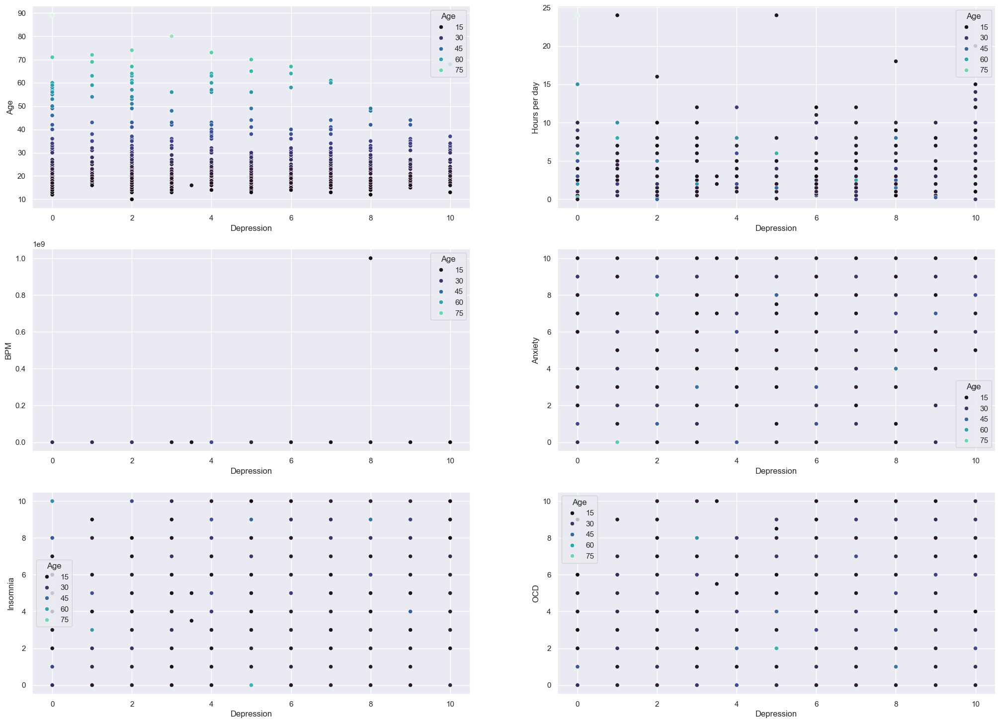

In [112]:
sele = ['Age','Hours per day','BPM','Anxiety','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(sele):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Depression',y=col,hue='Age',data=mentalMusicData,palette="mako")

Ansiedad VS columnas de interes

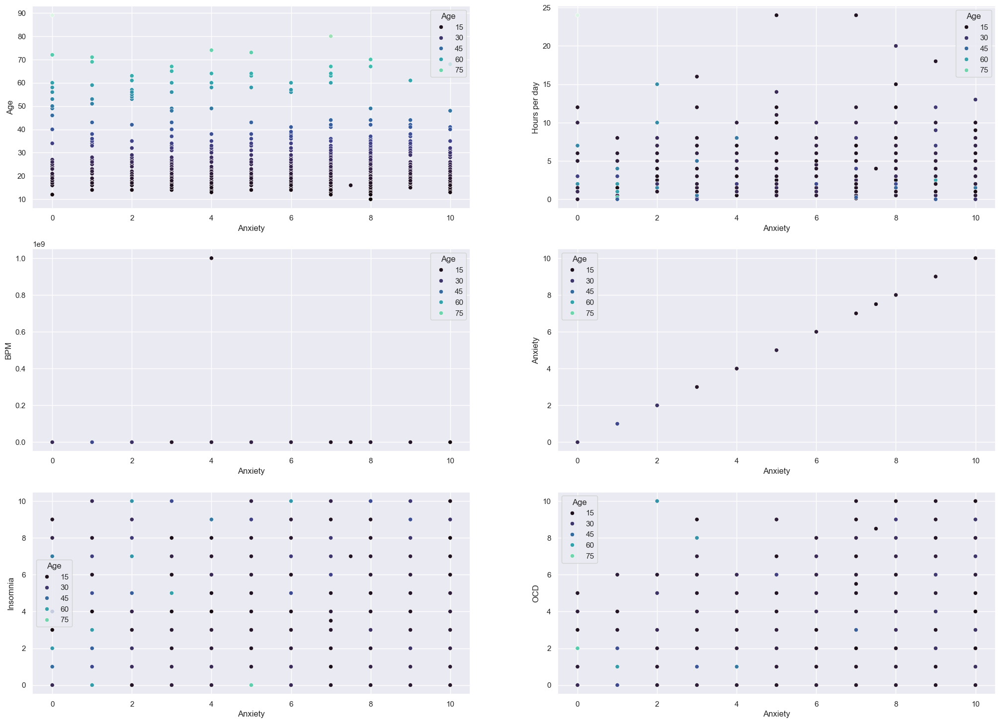

In [113]:
sele = ['Age','Hours per day','BPM','Anxiety','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(sele):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Anxiety',y=col,hue='Age',data=mentalMusicData,palette="mako")

OCD VS columnas de interes

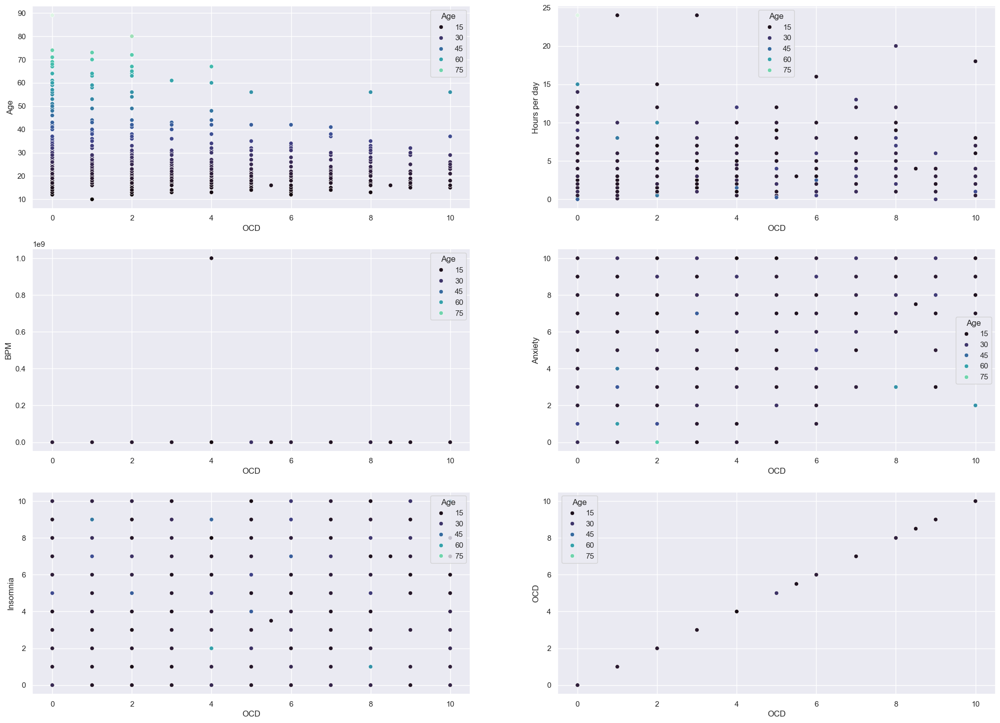

In [114]:
sele = ['Age','Hours per day','BPM','Anxiety','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(sele):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='OCD',y=col,hue='Age',data=mentalMusicData,palette="mako")

Debido a la naturaleza del DataSet, los datos no son fiables, ya que se trata de una encuesta donde al parecer los encuestados no dominaban muy el tema de la salud mental, por lo que se desechara parcialmente los datos. 
Los siguientes datos a analizar en el dataset son los gustos musicales de los encuestados.

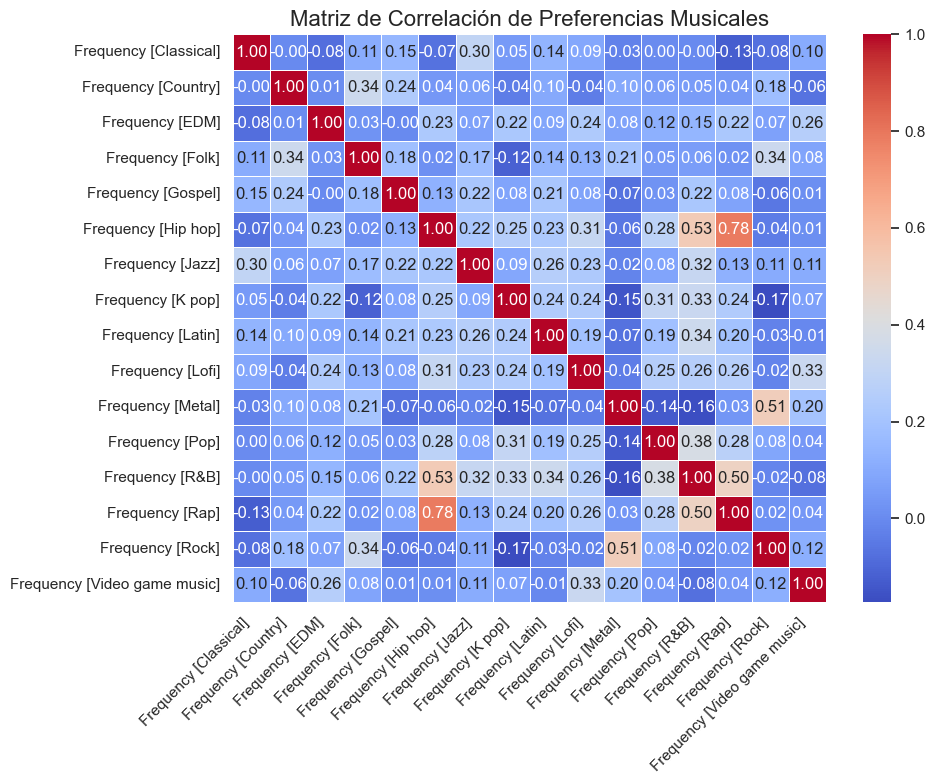

In [115]:
musicPreferences = [col for col in mentalMusicData if col.startswith("Frequency")]
dfPreferences = mentalMusicData[musicPreferences]
frequencyMap = {
    'Never': 0,
    'Rarely': 1, 
    'Sometimes': 2,
    'Very frequently': 3
}
dfPreferences = dfPreferences.applymap(
    lambda x: frequencyMap.get(x, float('nan'))  
)

corrPref = dfPreferences.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corrPref, 
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=0.5
)


plt.title('Matriz de Correlación de Preferencias Musicales', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

correlaciones altas
correlaciones medias


<Axes: >

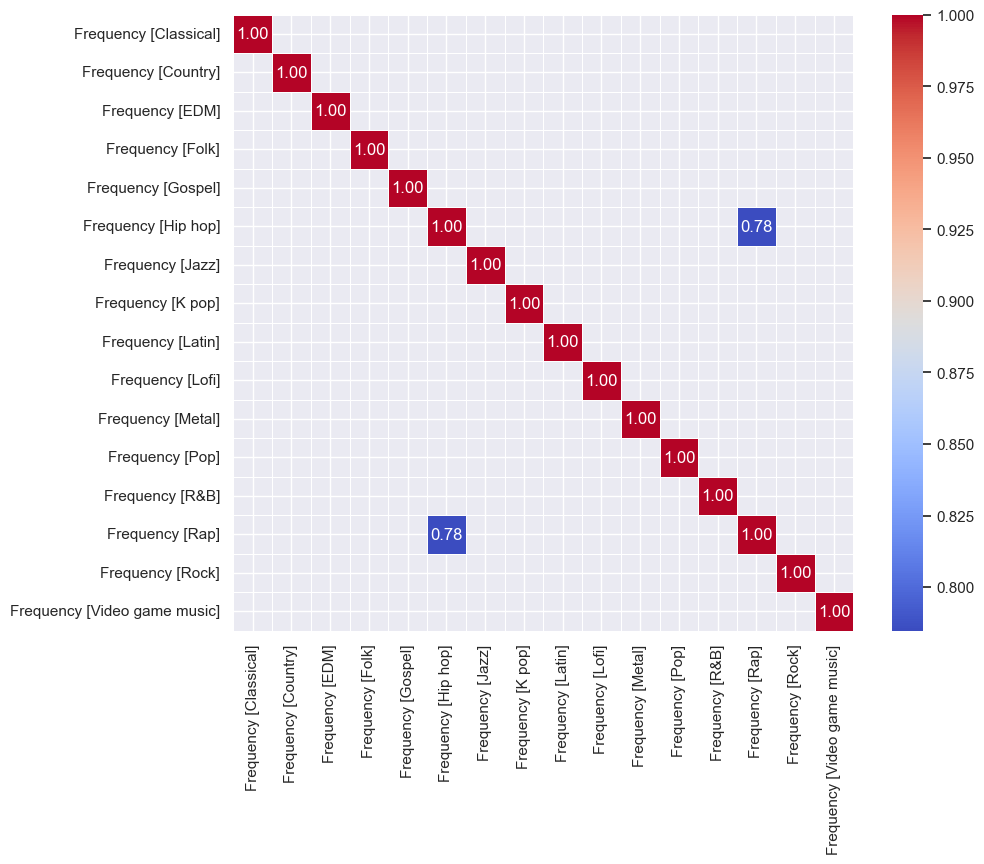

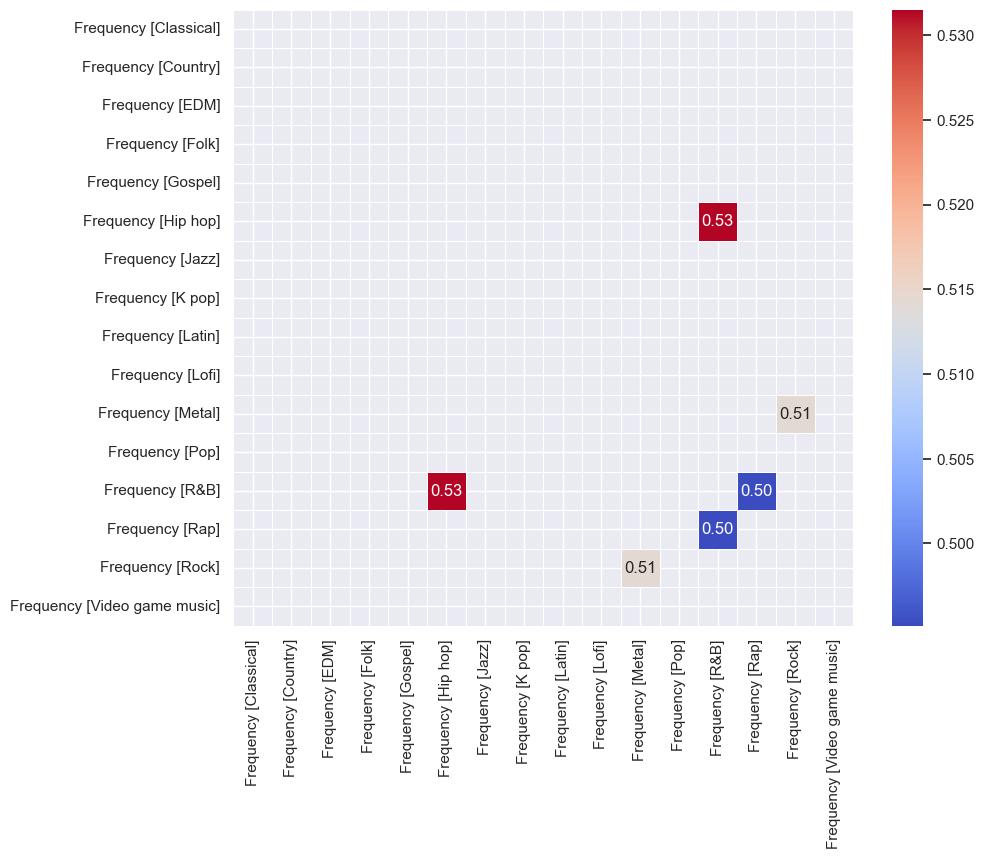

In [116]:

high_threshold = 0.7
medium_threshold = 0.4

high_corr = corrPref.applymap(lambda x: x if abs(x) > high_threshold else np.nan)
medium_corr = corrPref.applymap(lambda x: x if abs(x) >= medium_threshold and abs(x) <= high_threshold else np.nan)

print("correlaciones altas")
plt.figure(figsize=(10, 8))
sns.heatmap(
    high_corr, 
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=0.5
)

print("correlaciones medias")

plt.figure(figsize=(10, 8))
sns.heatmap(
    medium_corr, 
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=0.5
)



El dataSet tampoco muestra mucho acerca de las relaciones entre generos musicales, muestra algunas relaciones como:

En menor medida

* Hip hop y R&B
* Metal y Rock
* Rap y R&B

En mayor medida

* Rap y Hip hop

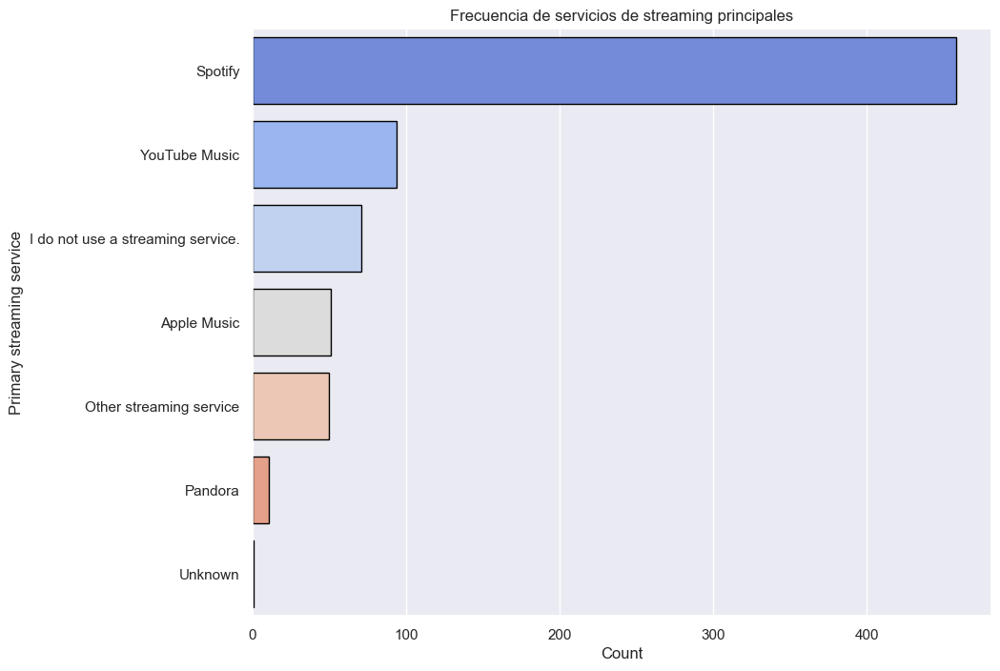

In [117]:

frequency_counts = mentalMusicData['Primary streaming service'].value_counts().reset_index()
frequency_counts.columns = ['Primary streaming service', 'Count']
plt.figure(figsize=(10, 8))
sns.barplot(
    x='Count', 
    y='Primary streaming service',
    data=frequency_counts, 
    edgecolor='black', 
    palette='coolwarm'
)
plt.title('Frecuencia de servicios de streaming principales')
plt.show()

Segun la informacion anterior vamos a tomar un dataset de spotify para realizar un estudio mas profundo acerca de generos musicales y sus similitudes.

Analisis de dataset que contiene 30,000 canciones del API de Spotify.
Contiene informacion relevante para la construccion de playlist e identificacion de generos.

Descripcion de variables
| variable                | class      | description                                                                                                                                                                                                                                                                          |
|-------------------------|------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| track_id                | character  | Song unique ID                                                                                                                              |
| track_name              | character  | Song Name                                                                                                                                                                                                                                                          |
| track_artist            | character  | Song Artist                                                                                                                                                                                          |
| track_popularity        | double     | Song Popularity (0-100) where higher is better                                                                                                                                                                                                                                                                                                                                                                                                              |
| track_album_id          | character  | Album unique ID                                                                                                                                                                                                                                                                       |
| track_album_name        | character  | Song album name                                                                                                                                                                                                                                                                                                                                                        |
| track_album_release_date| character  | Date when album released                                                                                                                                                                                                                                                                                                                                                            |
| playlist_name           | character  | Name of playlist                                                                                                                                                                                                                                                                                                                                                           |
| playlist_id             | character  | Playlist ID                                                                                                                                                                                                                                                                                                                                                            |
| playlist_genre          | character  | Playlist genre                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| playlist_subgenre       | character  | Playlist subgenre                                                                                                                                                                                                                                                                                                                                                        |
| danceability            | double     | Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.                                                                                                                                                                     |
| energy                  | double     | Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.                                                                                                                                                                                                    |
| key                     | double     | The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation. E.g., 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.                                                                                                                                                                                            |
| loudness                | double     | The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.                                                                                                       |
| mode                    | double     | Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.                                                                                                                      |
| speechiness             | double     | Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g., talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.                                                                                                                                                                                    |
| acousticness            | double     | A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.                                                                                                                                                                                   |
| instrumentalness        | double     | Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.                                                                                                                                                                                                                                               |
| liveness                | double     | Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.                                                                                                                                                                                                                                |
| valence                 | double     | A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g., happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g., sad, depressed, angry).                                                                                                                                                                                                                                                                  |
| tempo                   | double     | The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.                                                                                                                                                                                                                                                                |
| duration_ms             | double     | Duration of song in milliseconds                                                                                                                                                                       |


In [118]:
musicFeatureData.head()


,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [119]:
musicFeatureData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [120]:
print(musicFeatureData.isnull().sum())

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64


In [121]:
musicFeatureData[musicFeatureData['track_album_name'].isnull()]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
8151,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,HIP&HOP,5DyJsJZOpMJh34WvUrQzMV,rap,...,6,-7.635,1,0.1760,0.0410,0.00000,0.1160,0.649,95.999,282707
9282,5cjecvX0CmC9gK0Laf5EMQ,NaN,NaN,0,3luHJEPw434tvNbme3SP8M,NaN,2017-12-01,GANGSTA Rap,5GA8GDo7RQC3JEanT81B3g,rap,...,11,-5.364,0,0.3190,0.0534,0.00000,0.5530,0.191,146.153,202235
9283,5TTzhRSWQS4Yu8xTgAuq6D,NaN,NaN,0,3luHJEPw434tvNbme3SP8M,NaN,2017-12-01,GANGSTA Rap,5GA8GDo7RQC3JEanT81B3g,rap,...,10,-5.907,0,0.3070,0.0963,0.00000,0.0888,0.505,86.839,206465
19568,3VKFip3OdAvv4OfNTgFWeQ,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,Reggaeton viejito🔥,0si5tw70PIgPkY1Eva6V8f,latin,...,11,-6.075,0,0.0366,0.0606,0.00653,0.1030,0.726,97.017,252773
19811,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,latin hip hop,3nH8aytdqNeRbcRCg3dw9q,latin,...,6,-7.635,1,0.1760,0.0410,0.00000,0.1160,0.649,95.999,282707


In [122]:
musicFeatureData[musicFeatureData['track_artist'].isnull()]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
8151,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,HIP&HOP,5DyJsJZOpMJh34WvUrQzMV,rap,...,6,-7.635,1,0.1760,0.0410,0.00000,0.1160,0.649,95.999,282707
9282,5cjecvX0CmC9gK0Laf5EMQ,NaN,NaN,0,3luHJEPw434tvNbme3SP8M,NaN,2017-12-01,GANGSTA Rap,5GA8GDo7RQC3JEanT81B3g,rap,...,11,-5.364,0,0.3190,0.0534,0.00000,0.5530,0.191,146.153,202235
9283,5TTzhRSWQS4Yu8xTgAuq6D,NaN,NaN,0,3luHJEPw434tvNbme3SP8M,NaN,2017-12-01,GANGSTA Rap,5GA8GDo7RQC3JEanT81B3g,rap,...,10,-5.907,0,0.3070,0.0963,0.00000,0.0888,0.505,86.839,206465
19568,3VKFip3OdAvv4OfNTgFWeQ,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,Reggaeton viejito🔥,0si5tw70PIgPkY1Eva6V8f,latin,...,11,-6.075,0,0.0366,0.0606,0.00653,0.1030,0.726,97.017,252773
19811,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,latin hip hop,3nH8aytdqNeRbcRCg3dw9q,latin,...,6,-7.635,1,0.1760,0.0410,0.00000,0.1160,0.649,95.999,282707


In [123]:
print('Number of duplicated rows: ' , len(musicFeatureData[musicFeatureData.duplicated()]))

Number of duplicated rows:  0


In [124]:
musicFeatureData.shape

(32833, 23)

In [125]:
unique = musicFeatureData.nunique().sort_values()
unique_values = musicFeatureData.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
acousticness,3731,"[0.102, 0.0724, 0.0794, 0.0287, 0.0803, 0.0799..."
danceability,822,"[0.748, 0.726, 0.675, 0.718, 0.65, 0.449, 0.54..."
duration_ms,19785,"[194754, 162600, 176616, 169093, 189052, 16304..."
energy,952,"[0.916, 0.815, 0.931, 0.93, 0.833, 0.919, 0.85..."
instrumentalness,4729,"[0.0, 0.00421, 2.33e-05, 9.43e-06, 4.83e-06, 3..."
key,12,"[6, 11, 1, 7, 8, 5, 4, 2, 0, 10, 9, 3]"
liveness,1624,"[0.0653, 0.357, 0.11, 0.204, 0.0833, 0.143, 0...."
loudness,10222,"[-2.634, -4.969, -3.432, -3.778, -4.672, -5.38..."
mode,2,"[1, 0]"
playlist_genre,6,"[pop, rap, rock, latin, r&b, edm]"


Histograma de columnas

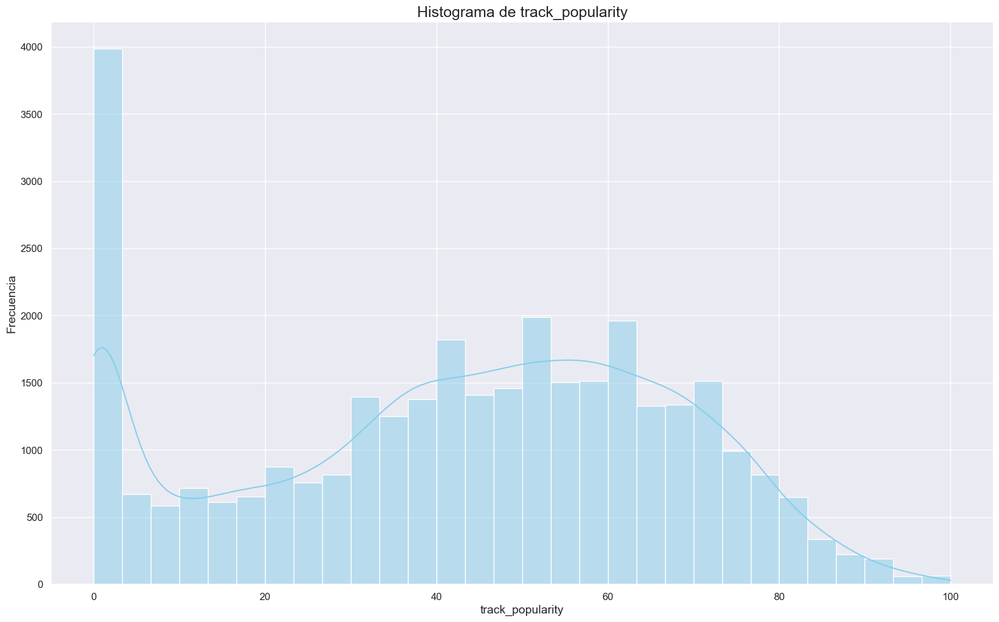

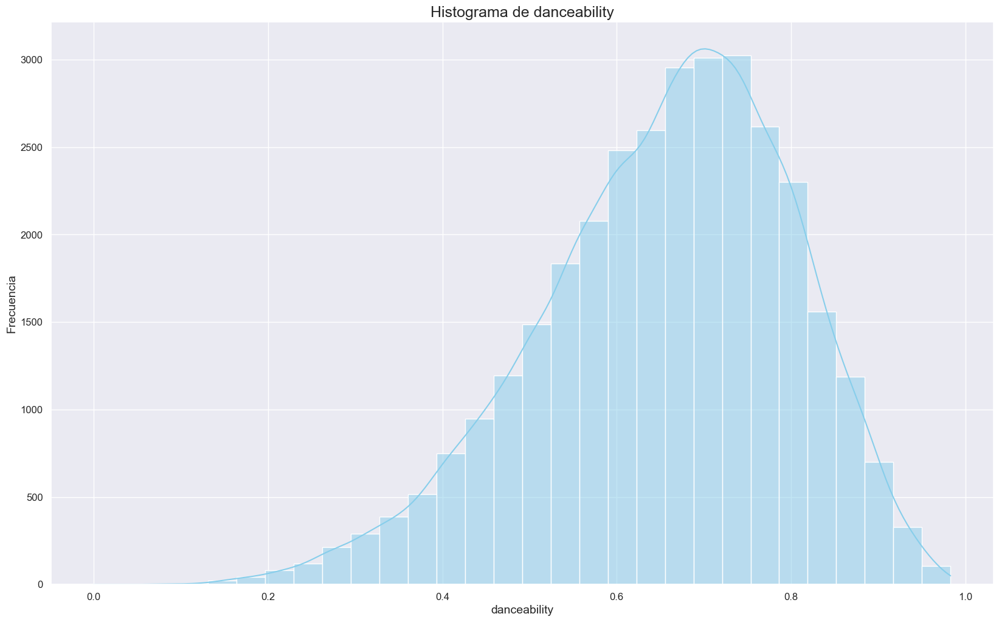

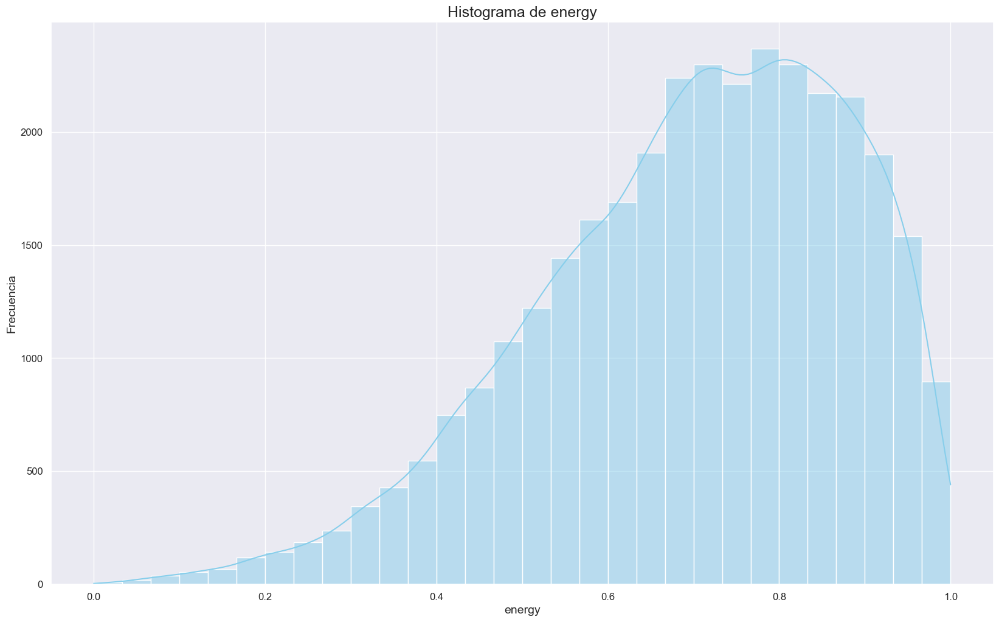

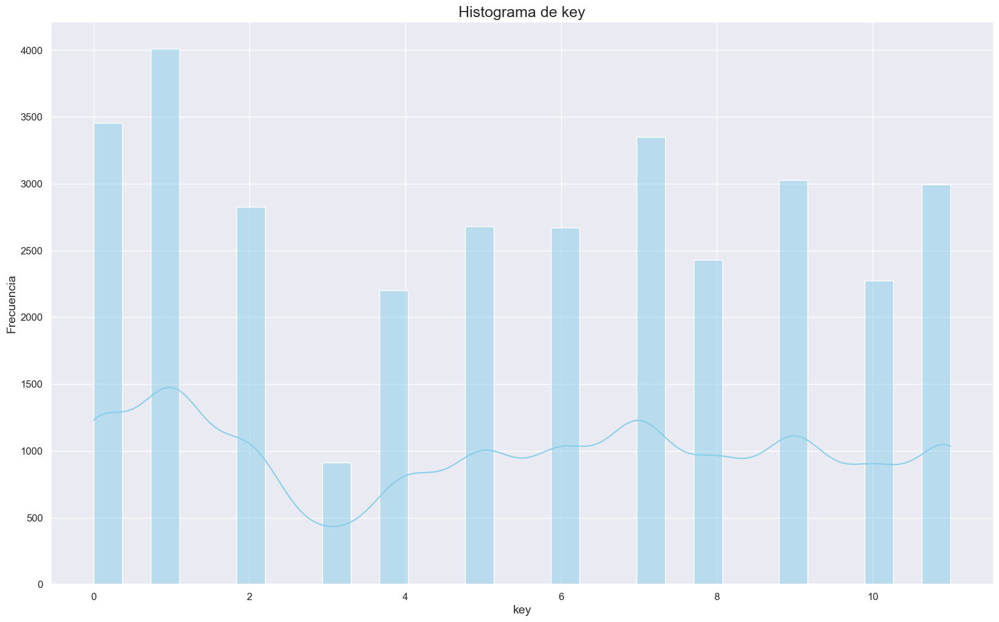

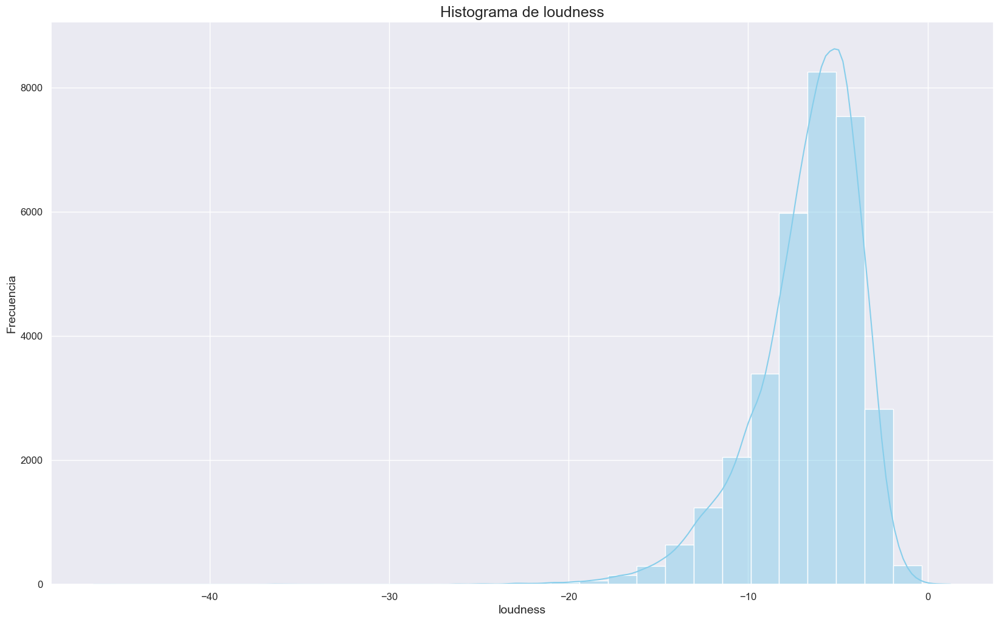

...

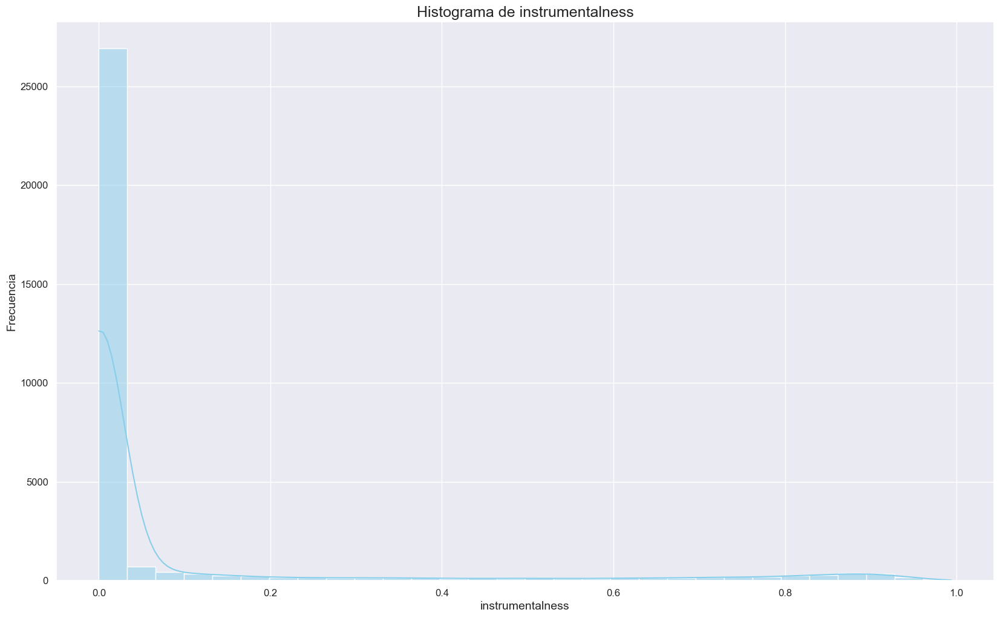

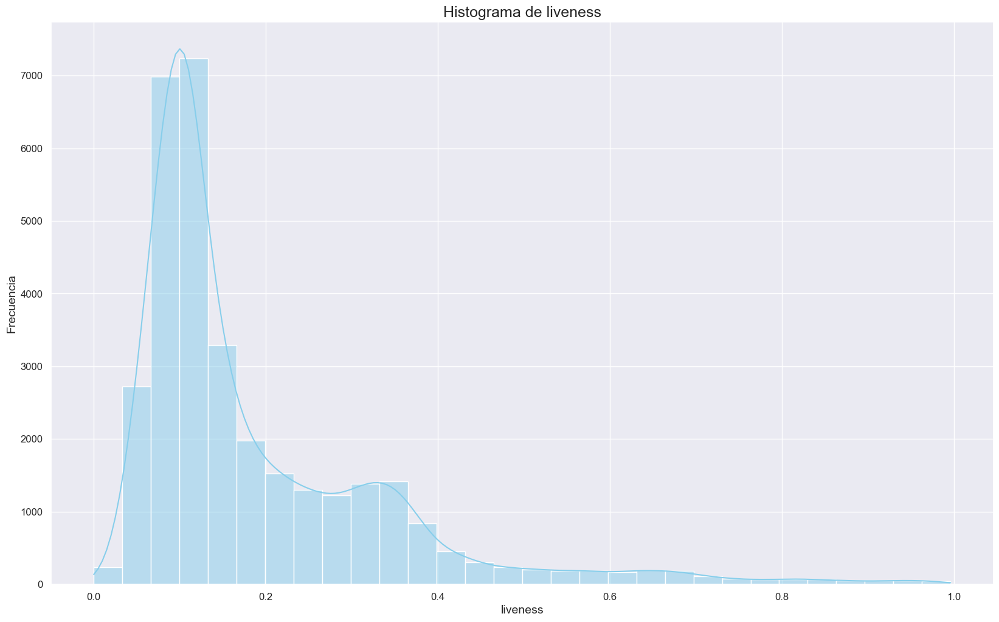

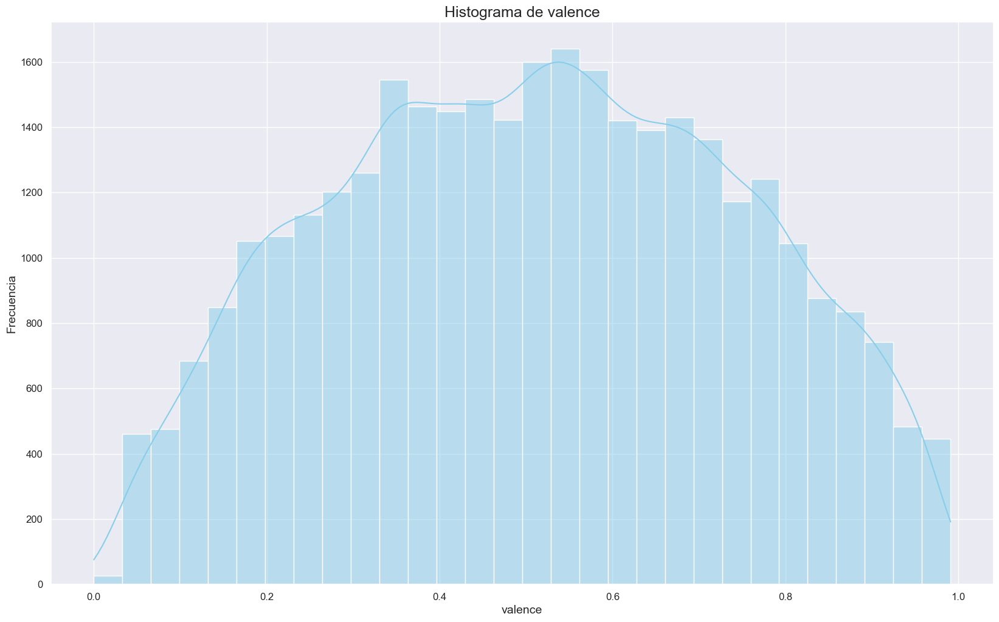

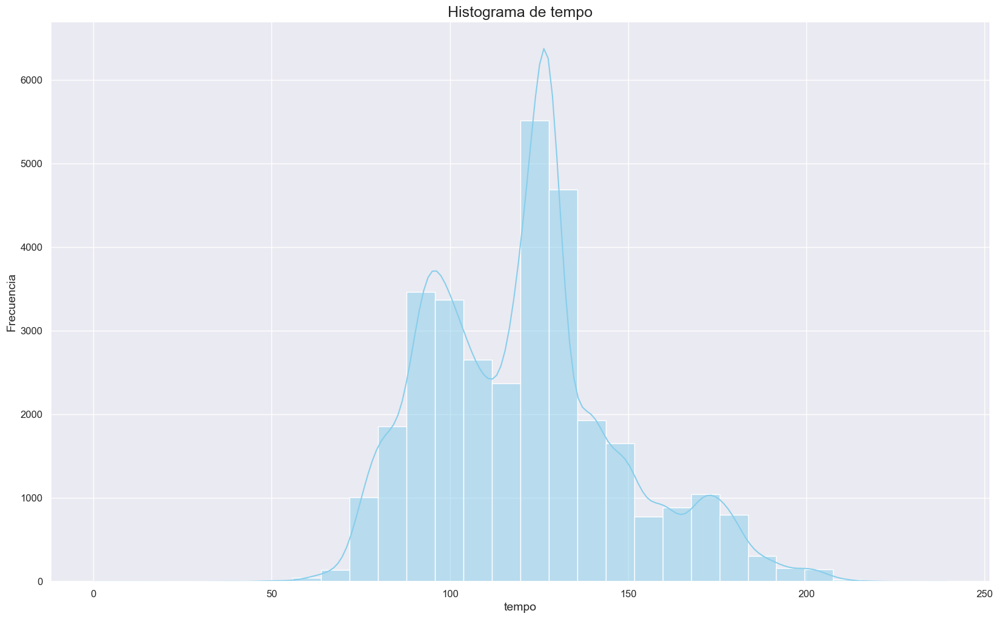

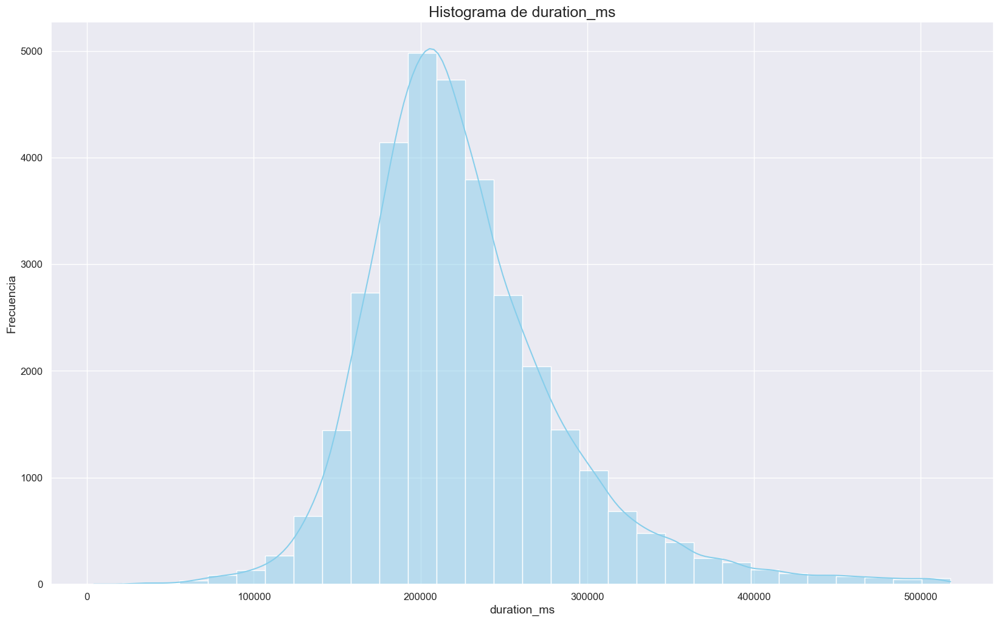

In [126]:
for columna in musicFeatureData.select_dtypes(include=[np.number]).columns:
    sns.histplot(data=musicFeatureData, x=columna, bins=30, kde=True, color='skyblue')
    plt.title(f'Histograma de {columna}', fontsize=18)
    plt.xlabel(columna, fontsize=14)
    plt.ylabel('Frecuencia', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

Lista de subgeneros

In [127]:
uniqueSubgen = musicFeatureData['playlist_subgenre'].unique()
print(uniqueSubgen)

['dance pop' 'post-teen pop' 'electropop' 'indie poptimism' 'hip hop'
 'southern hip hop' 'gangster rap' 'trap' 'album rock' 'classic rock'
 'permanent wave' 'hard rock' 'tropical' 'latin pop' 'reggaeton'
 'latin hip hop' 'urban contemporary' 'hip pop' 'new jack swing'
 'neo soul' 'electro house' 'big room' 'pop edm'
 'progressive electro house']


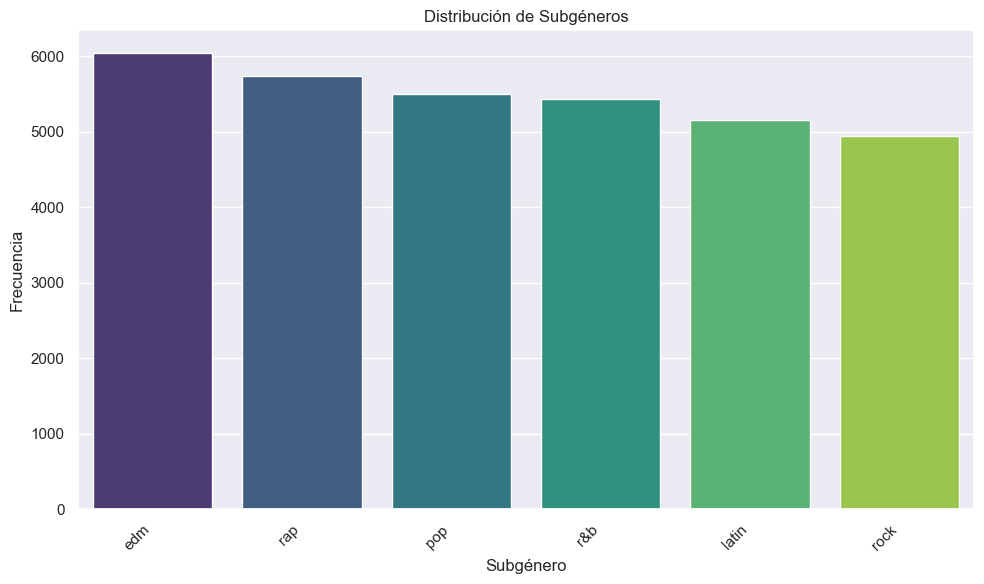

In [128]:
gen_count = musicFeatureData['playlist_genre'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=gen_count.index, y=gen_count.values, palette="viridis")
plt.xticks(rotation=45, ha='right')
plt.title('Distribución de Subgéneros')
plt.xlabel('Subgénero')
plt.ylabel('Frecuencia')
plt.tight_layout()
plt.show()

Los datos parecen estar distribuidos de manera equitatica en las variables target

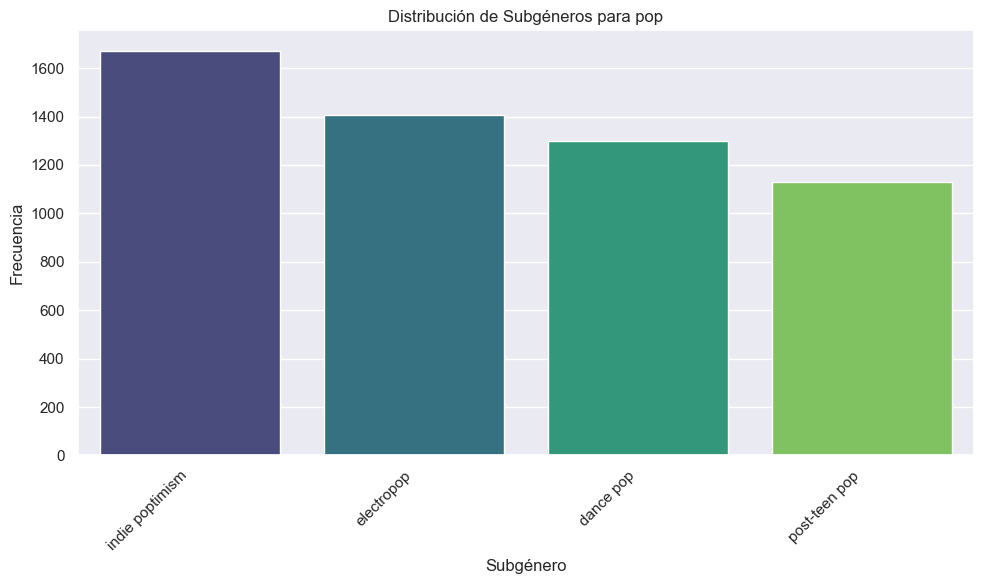

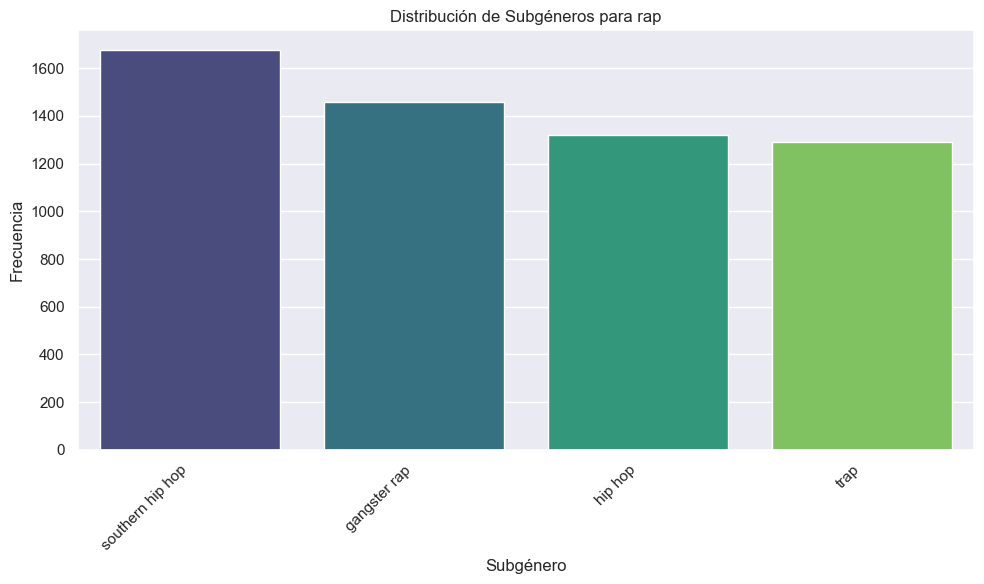

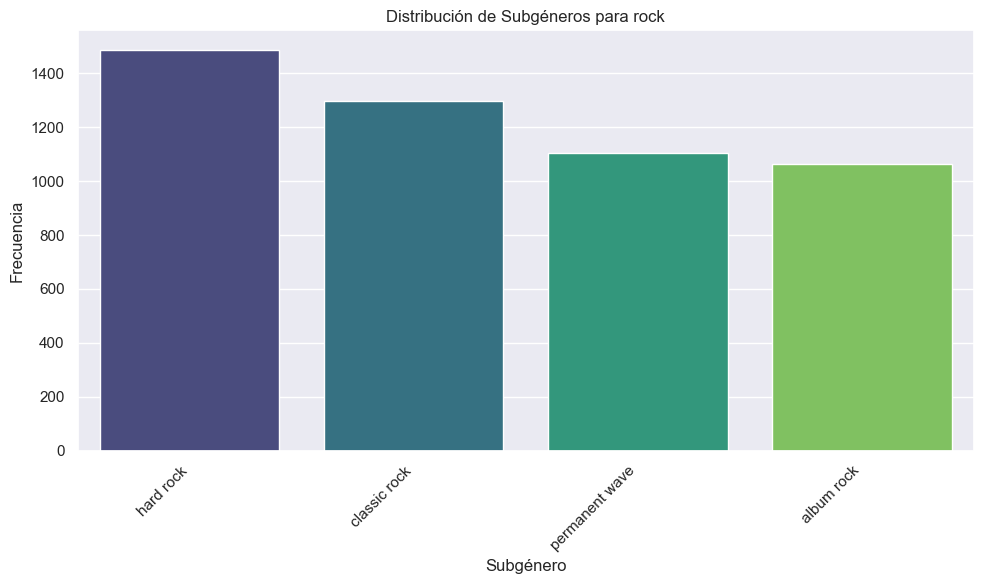

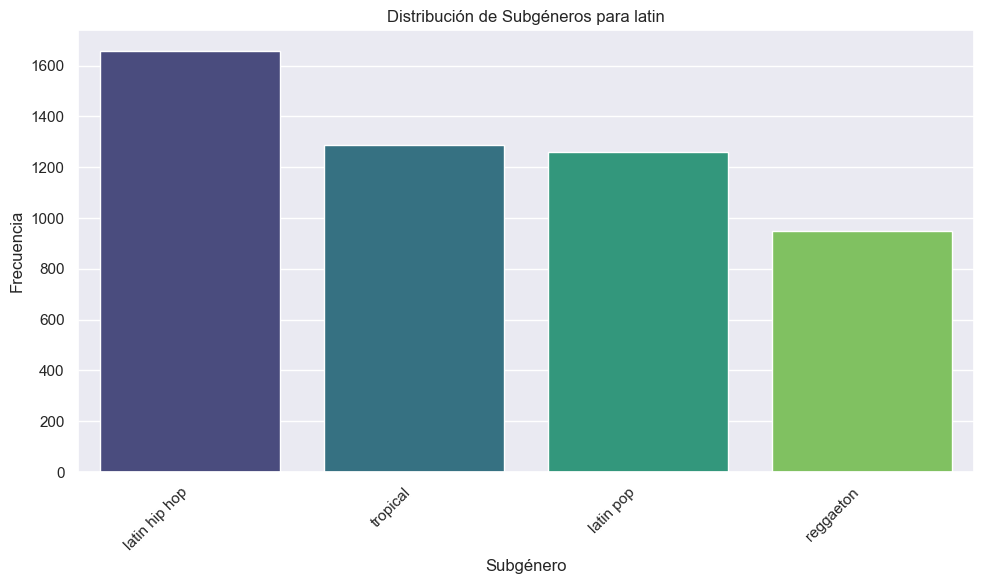

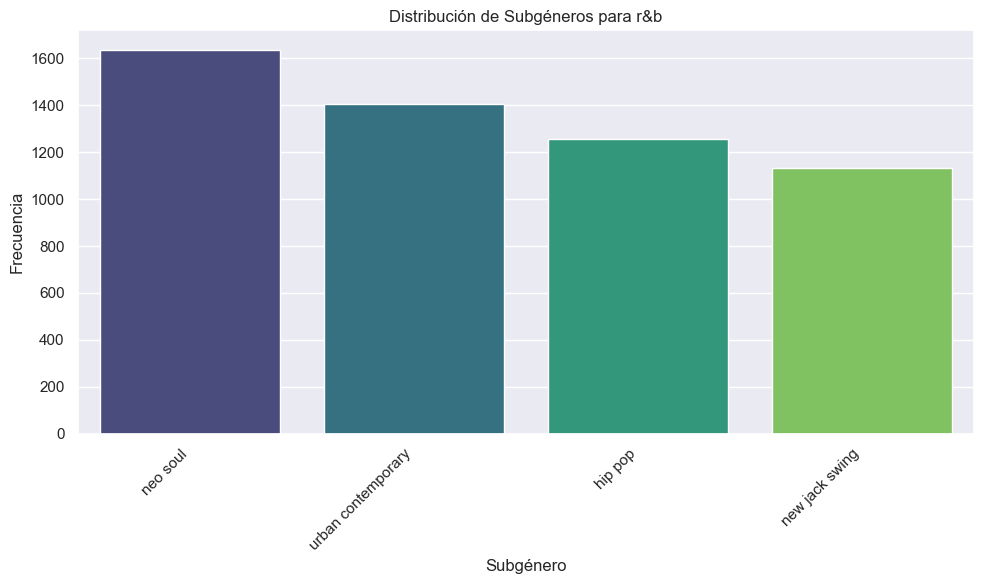

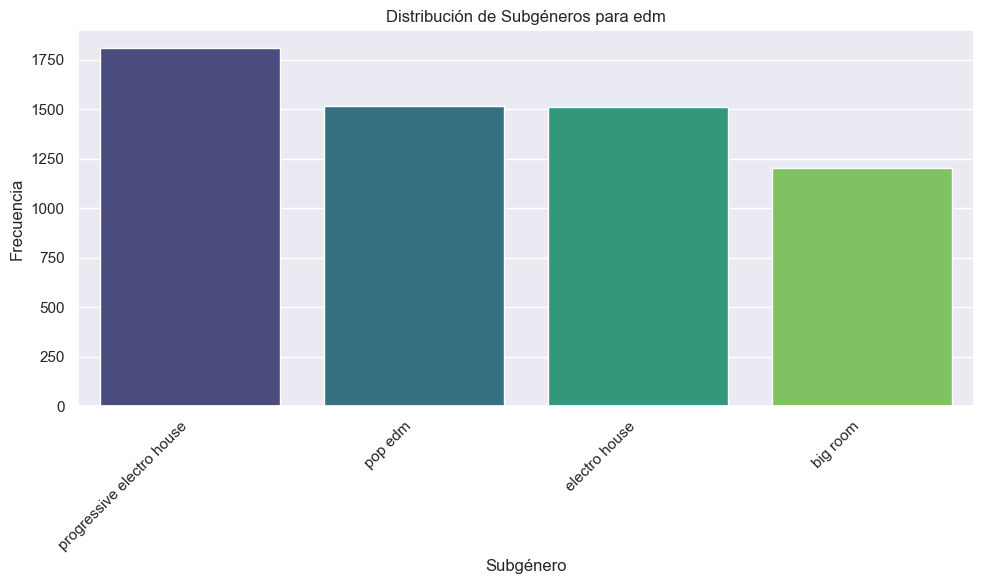

In [129]:
genre_subgenre_counts = musicFeatureData.groupby('playlist_genre')['playlist_subgenre'].value_counts()

for genre in musicFeatureData['playlist_genre'].unique():
    subgen_counts = genre_subgenre_counts[genre]
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x=subgen_counts.index, y=subgen_counts.values, palette="viridis")
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Distribución de Subgéneros para {genre}')
    plt.xlabel('Subgénero')
    plt.ylabel('Frecuencia')
    plt.tight_layout()
    plt.show()


Los subgeneros si se encuentran desbalanceados

Analisis de correlacion

<Axes: >

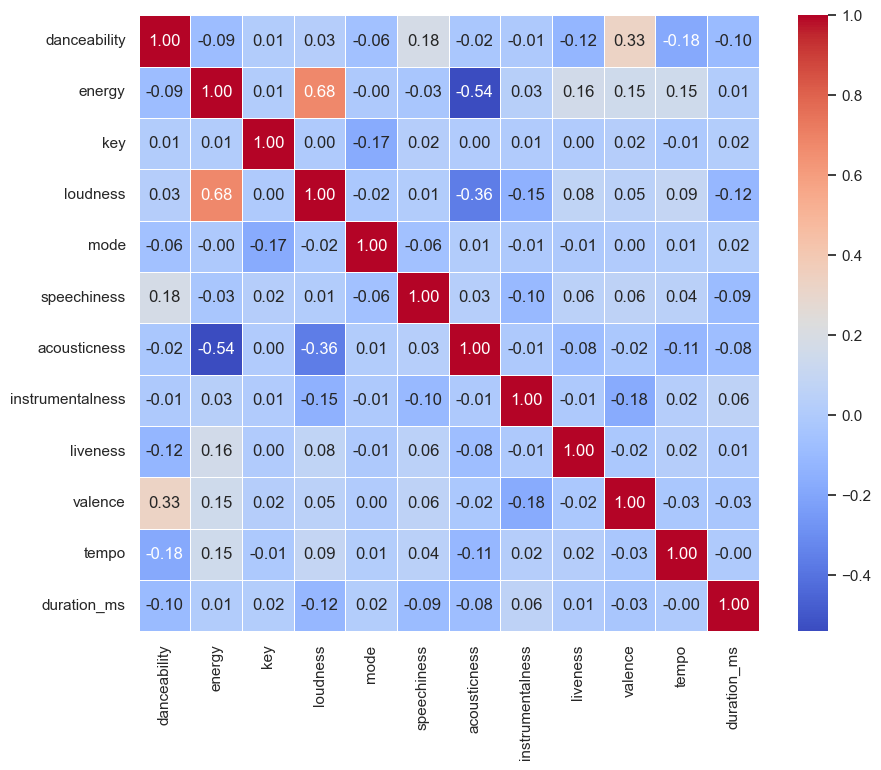

In [130]:
numerical_data = musicFeatureData.select_dtypes(include=['float64', 'int64'])
numerical_data = numerical_data.drop('track_popularity', axis=1)
corrMusicFeature = numerical_data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corrMusicFeature, 
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=0.5
)

Observaciones del analisis de correlacion:
* Correlaciones positivas significativas:
    * energy y loudness (0.68): Hay una correlación moderada entre energy y loudness. Esto tiene sentido, ya que las canciones con alta energía tienden a ser más fuertes en términos de volumen.
    * danceability y valence (0.33): Hay una correlación moderada entre danceability y valence. Esto es lógico, ya que las canciones más alegres, suelen ser más bailables.
* Correlaciones negativas significativas:
    * acousticness y energy (-0.54)
    * speechiness y loudness (-0.36)

Debido a que varios geneneros pueden tener diferentes valores no se hara ninguna reduccion de variables





Relacion de valores numericos con generos y subgeneros

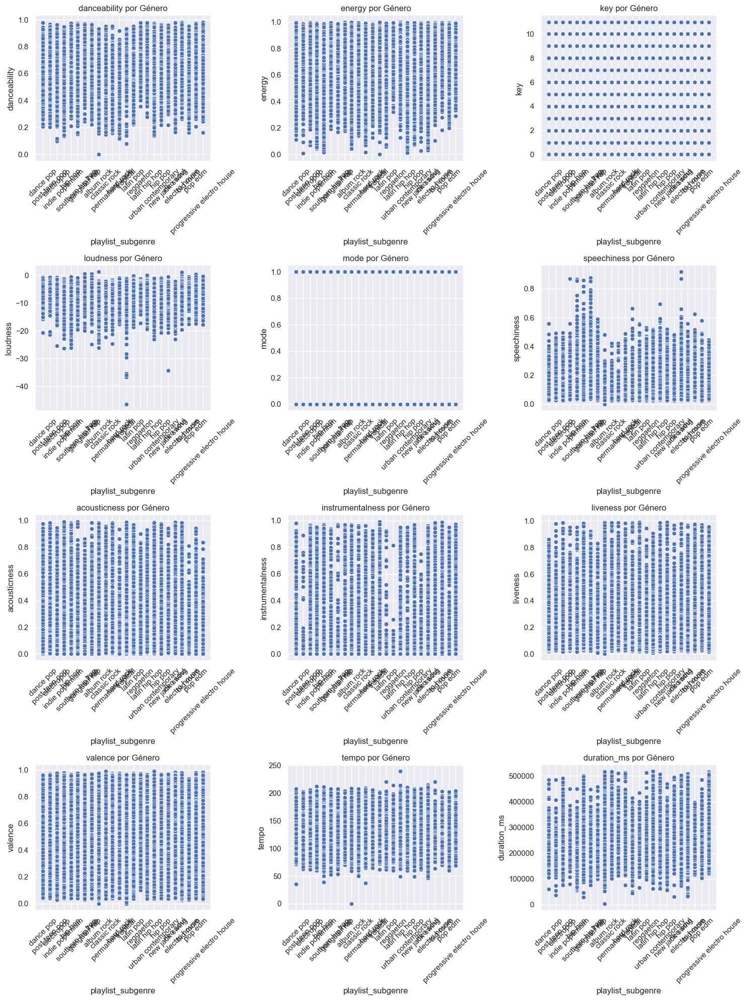

In [131]:
n_columns = len(numerical_data.columns)
n_rows = np.ceil(n_columns / 3).astype(int)  


plt.figure(figsize=(15, 5 * n_rows))

for i, column in enumerate(numerical_data.columns, 1):
    plt.subplot(n_rows, 3, i)  
    sns.scatterplot(x='playlist_subgenre', y=column, data=musicFeatureData)
    plt.title(f'{column} por Género')
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

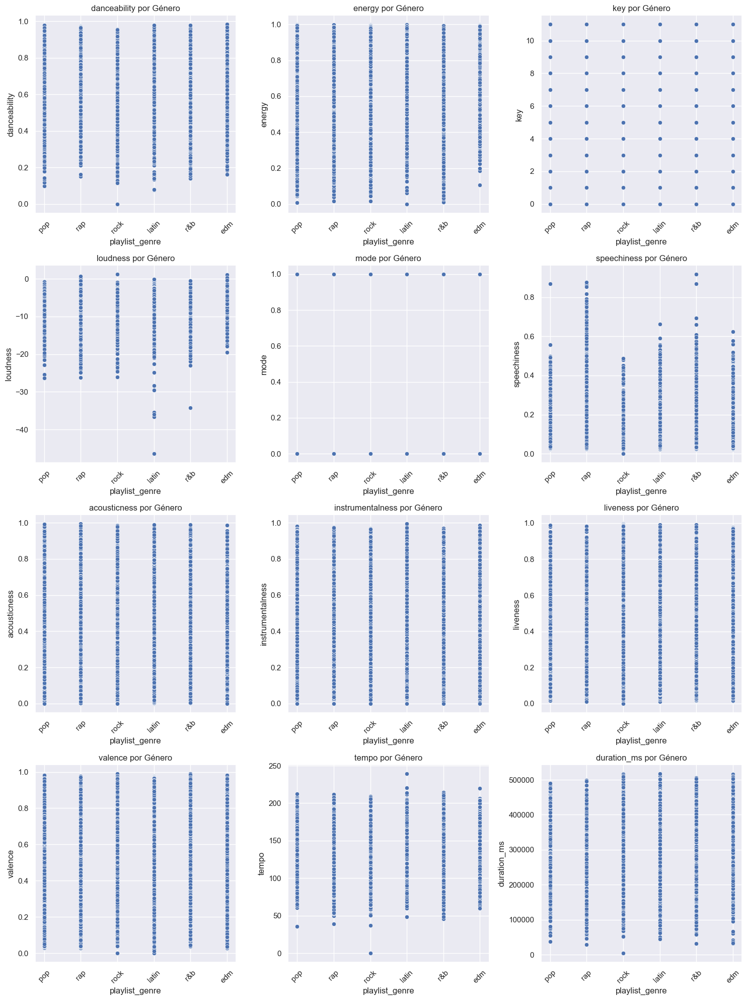

In [132]:
n_columns = len(numerical_data.columns)
n_rows = np.ceil(n_columns / 3).astype(int)  

plt.figure(figsize=(15, 5 * n_rows))

for i, column in enumerate(numerical_data.columns, 1):
    plt.subplot(n_rows, 3, i)  
    sns.scatterplot(x='playlist_genre', y=column, data=musicFeatureData)
    plt.title(f'{column} por Género')
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

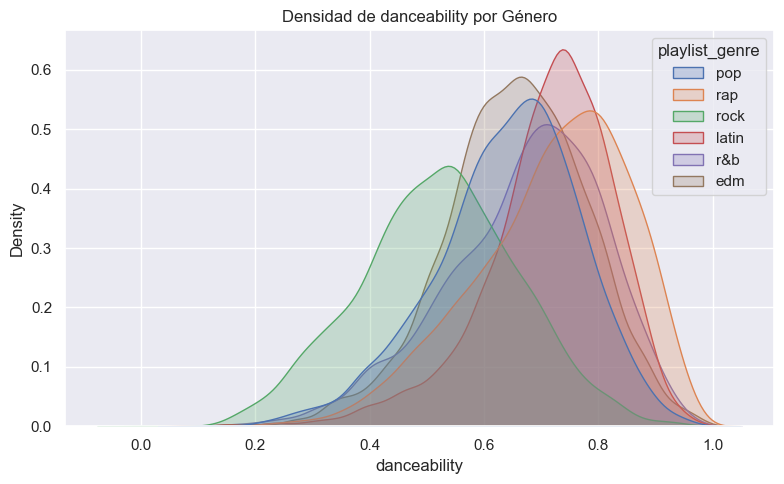

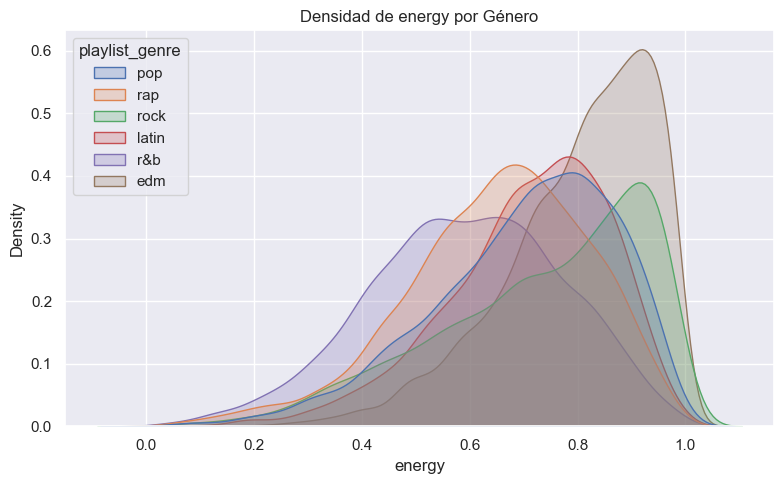

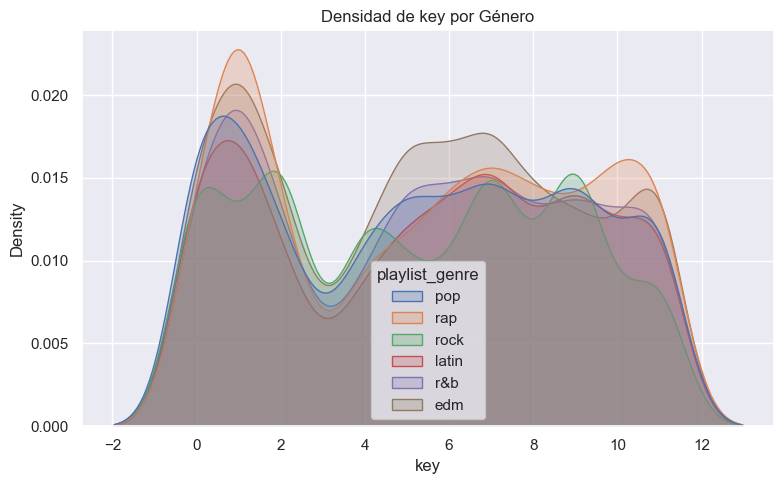

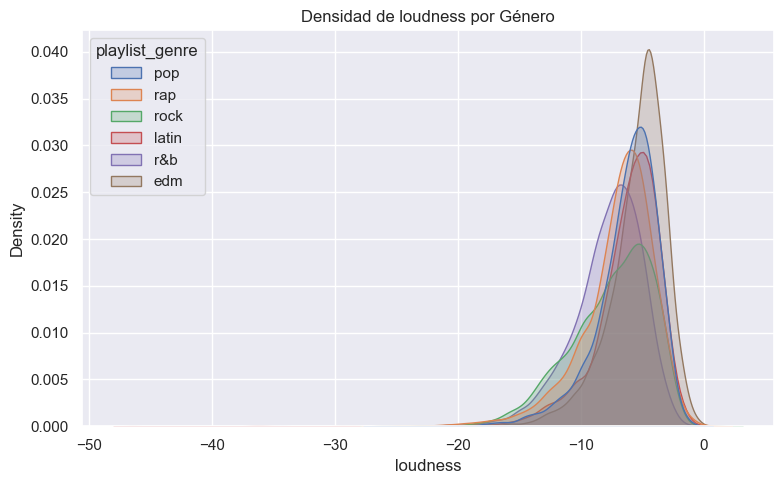

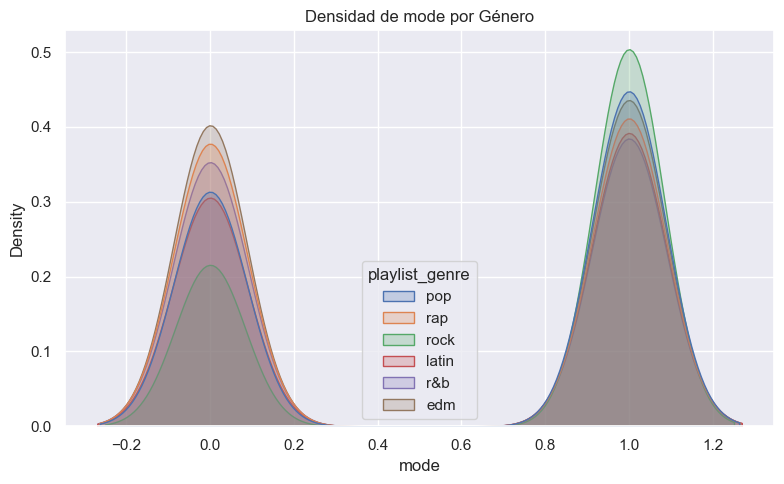

...

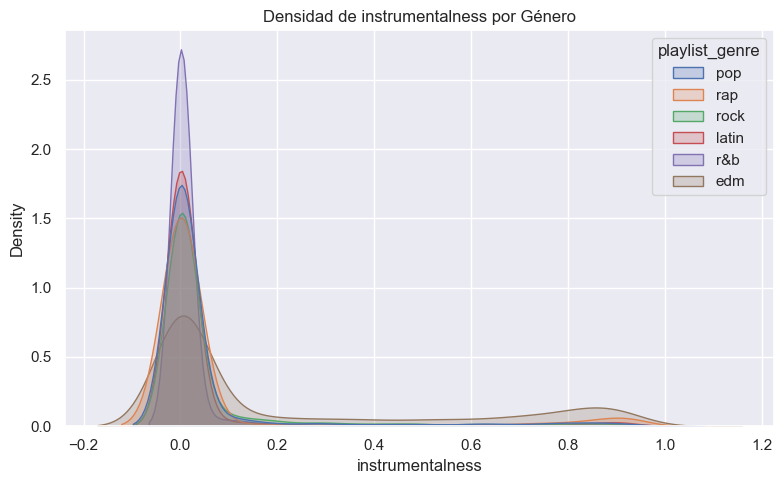

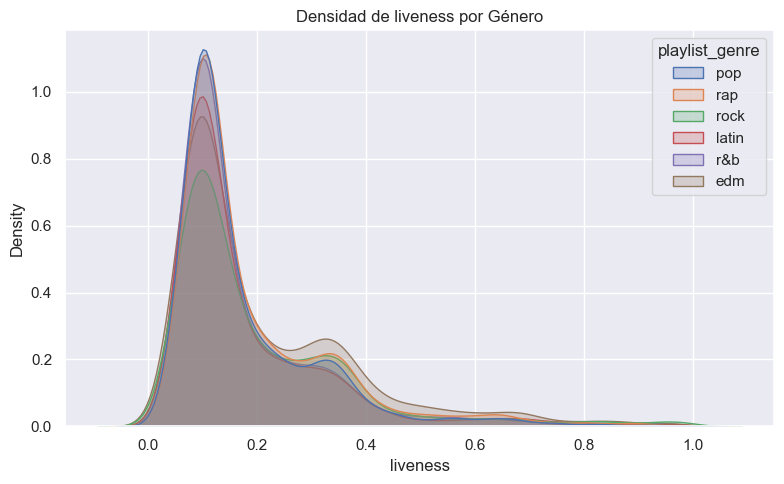

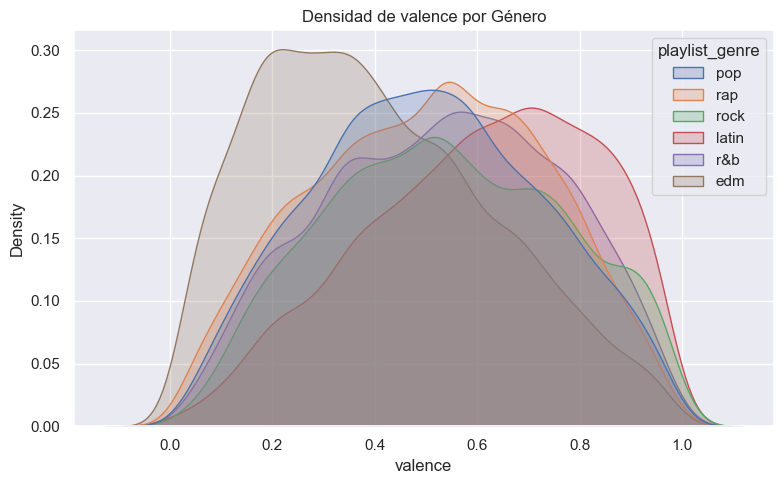

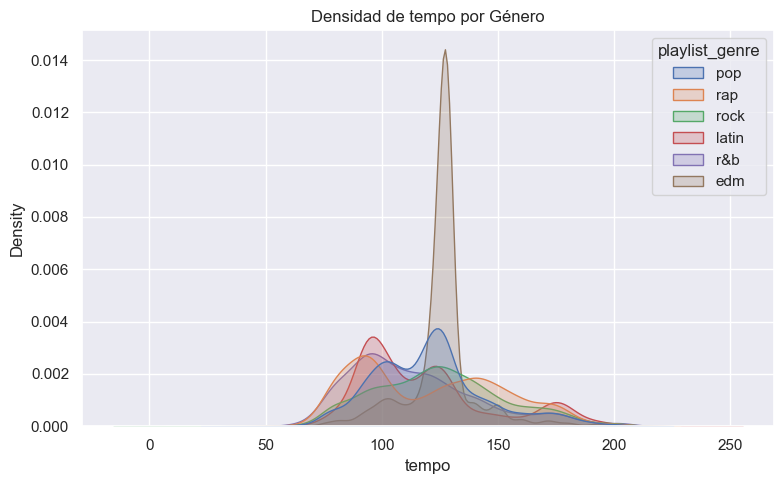

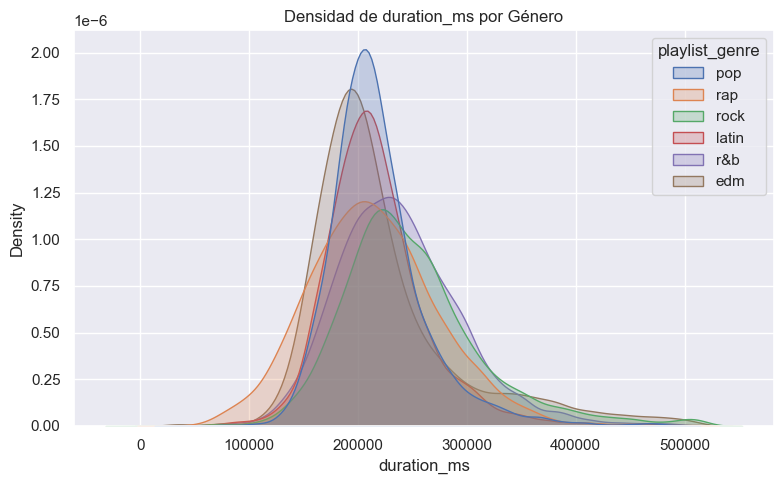

In [133]:
for column in numerical_data.columns:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=musicFeatureData, x=column, hue='playlist_genre', fill=True)
    plt.title(f'Densidad de {column} por Género')
    plt.tight_layout()
    plt.show()


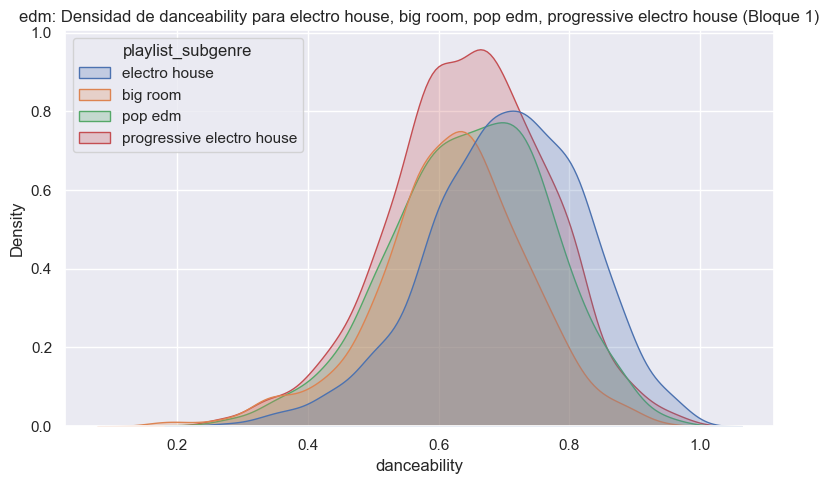

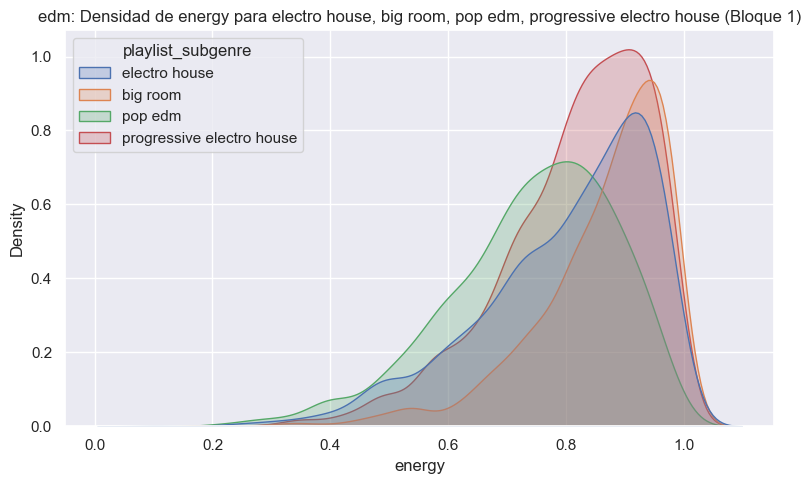

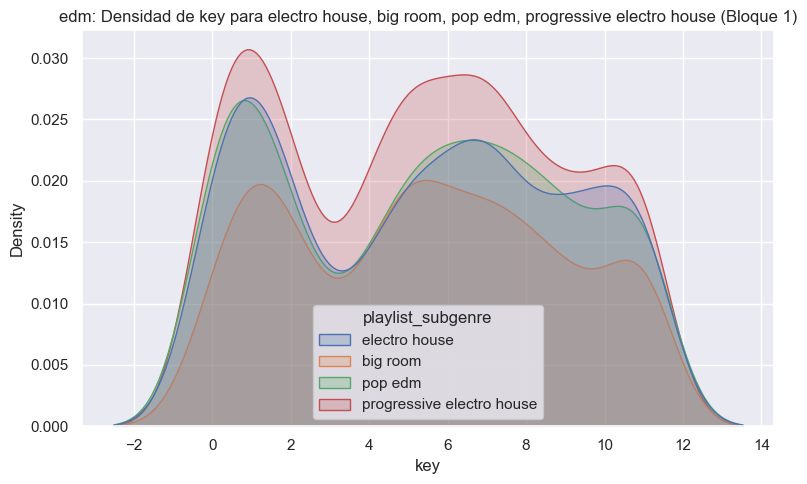

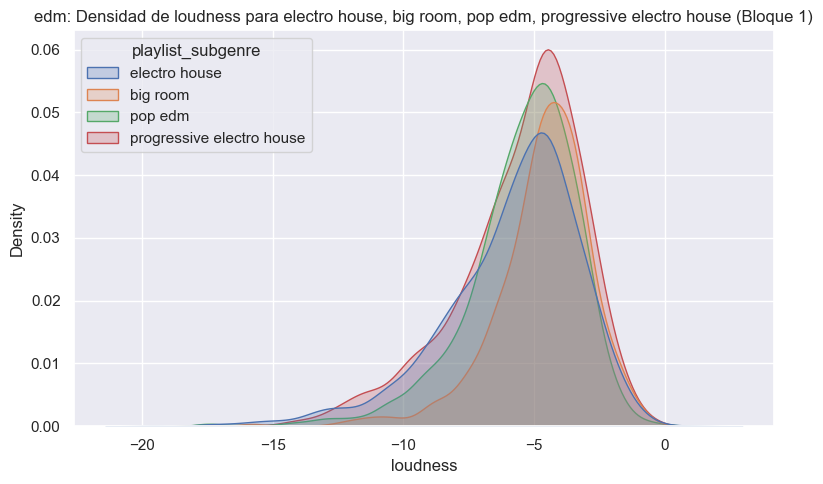

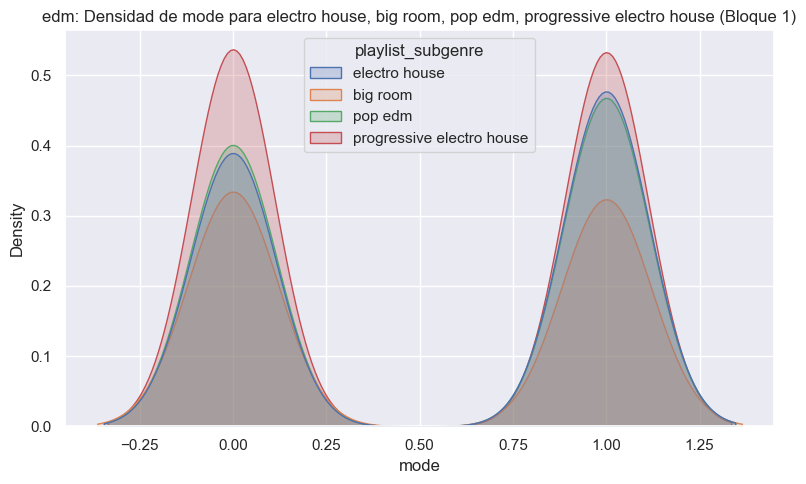

...

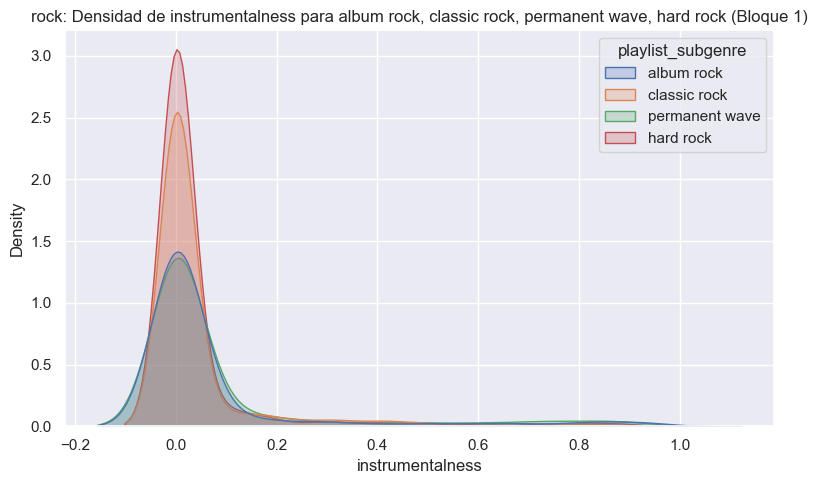

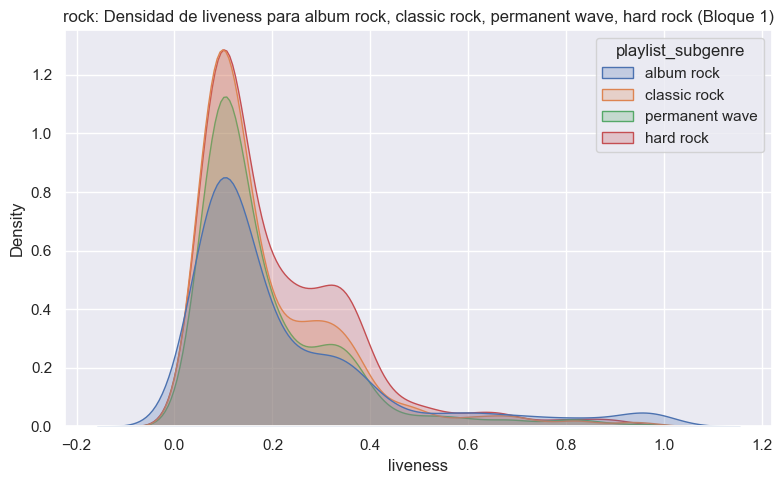

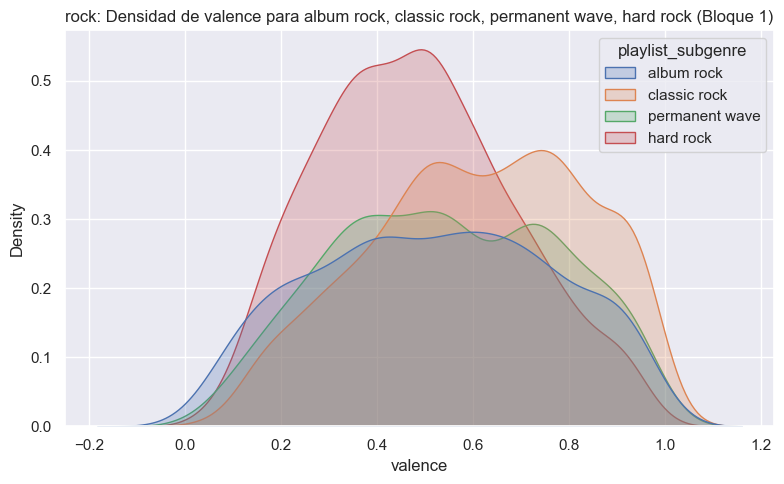

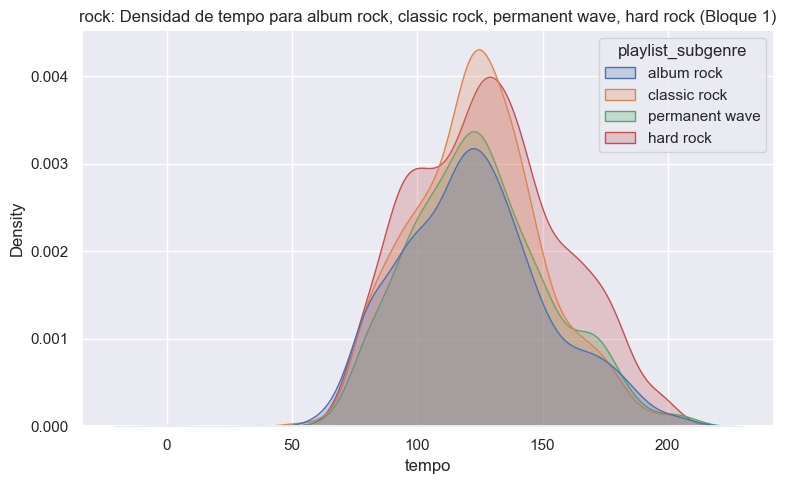

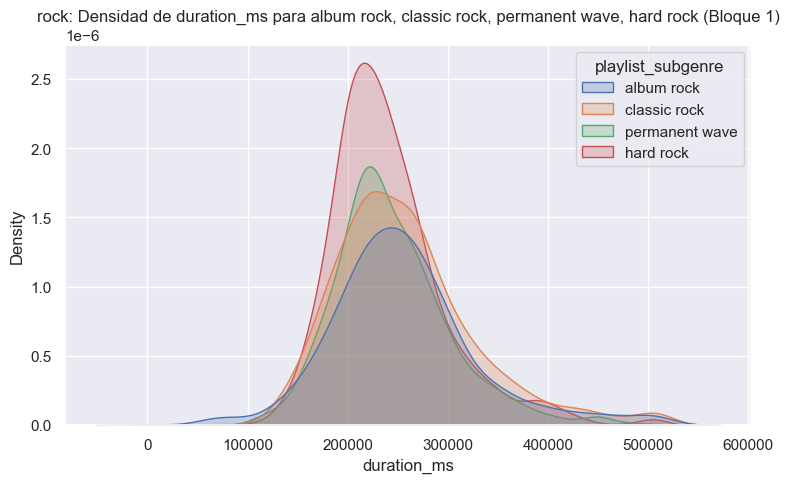

In [134]:
genre_groups = musicFeatureData.groupby('playlist_genre')['playlist_subgenre'].unique()

for genre, subgenres in genre_groups.items():
    subgenre_blocks = [subgenres[i:i+5] for i in range(0, len(subgenres), 5)]
    
    for block_idx, subgenre_block in enumerate(subgenre_blocks):
        subset = musicFeatureData[musicFeatureData['playlist_subgenre'].isin(subgenre_block)]
        
        for column in numerical_data.columns:
            plt.figure(figsize=(8, 5))
            sns.kdeplot(data=subset, x=column, hue='playlist_subgenre', fill=True)
            plt.title(f'{genre}: Densidad de {column} para {", ".join(subgenre_block)} (Bloque {block_idx + 1})')
            plt.tight_layout()
            plt.show()

In [135]:
genre_subgenre_counts

playlist_genre  playlist_subgenre        
edm             progressive electro house    1809
                pop edm                      1517
                electro house                1511
                big room                     1206
latin           latin hip hop                1656
                tropical                     1288
                latin pop                    1262
                reggaeton                     949
pop             indie poptimism              1672
                electropop                   1408
                dance pop                    1298
                post-teen pop                1129
r&b             neo soul                     1637
                urban contemporary           1405
                hip pop                      1256
                new jack swing               1133
rap             southern hip hop             1675
                gangster rap                 1458
                hip hop                      1322
        

playlist_subgenre
album rock                   949
big room                     949
tropical                     949
trap                         949
southern hip hop             949
reggaeton                    949
progressive electro house    949
post-teen pop                949
pop edm                      949
permanent wave               949
new jack swing               949
neo soul                     949
latin pop                    949
latin hip hop                949
indie poptimism              949
hip pop                      949
hip hop                      949
hard rock                    949
gangster rap                 949
electropop                   949
electro house                949
dance pop                    949
classic rock                 949
urban contemporary           949
Name: count, dtype: int64


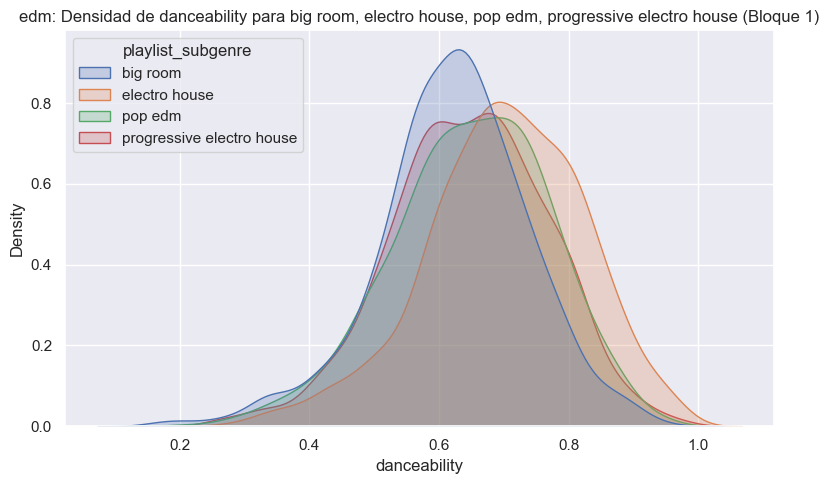

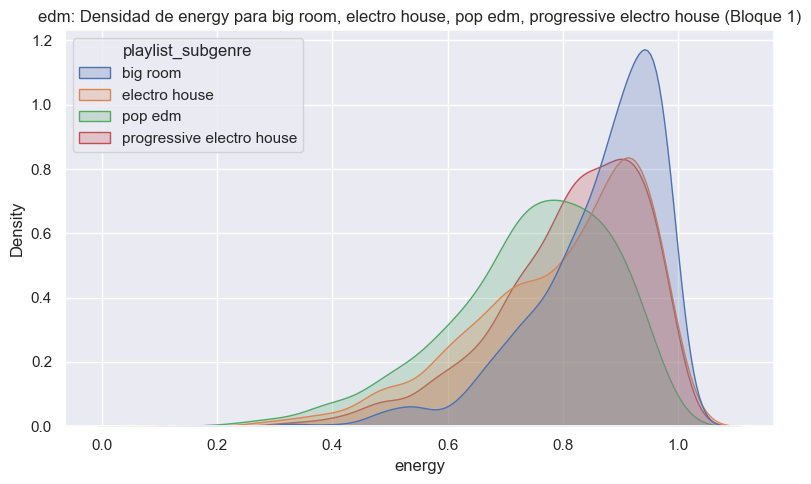

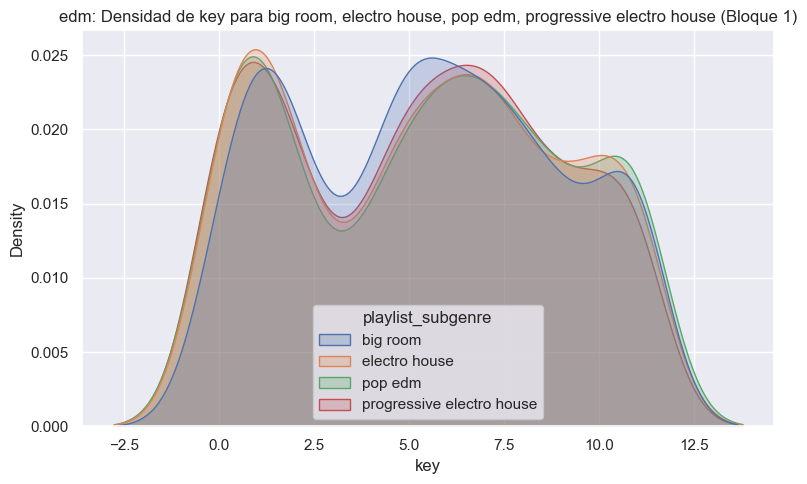

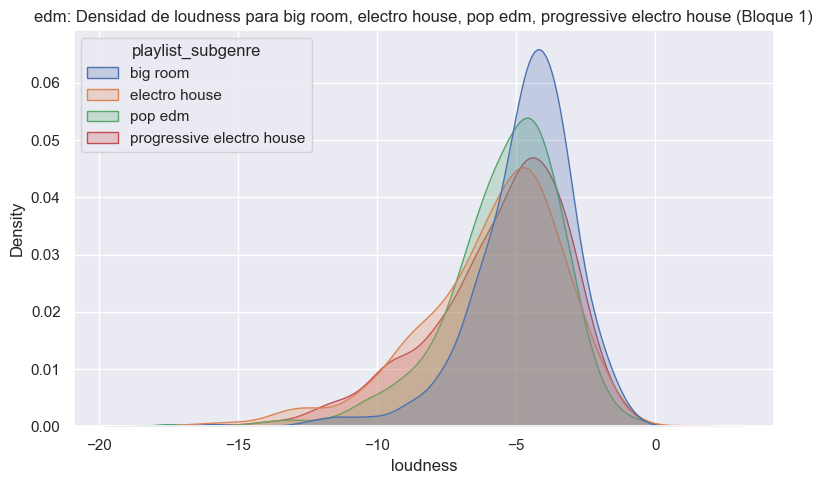

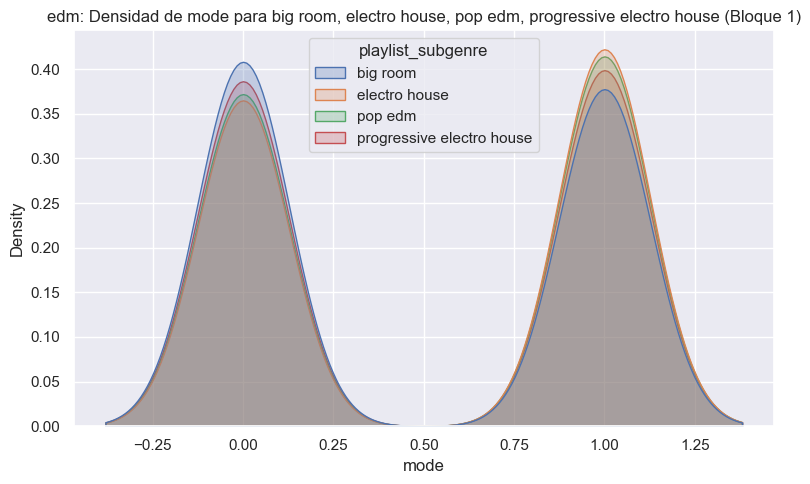

...

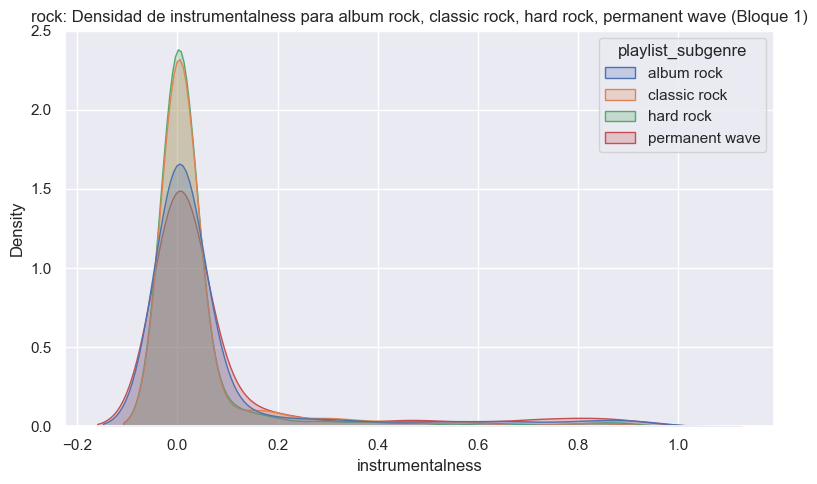

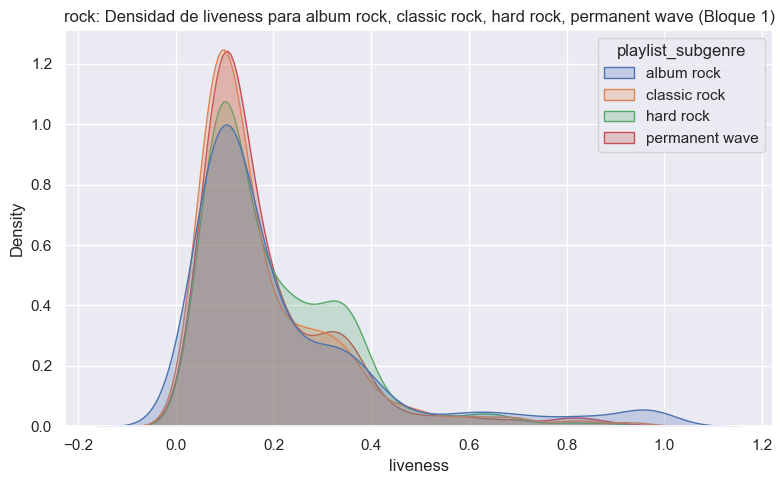

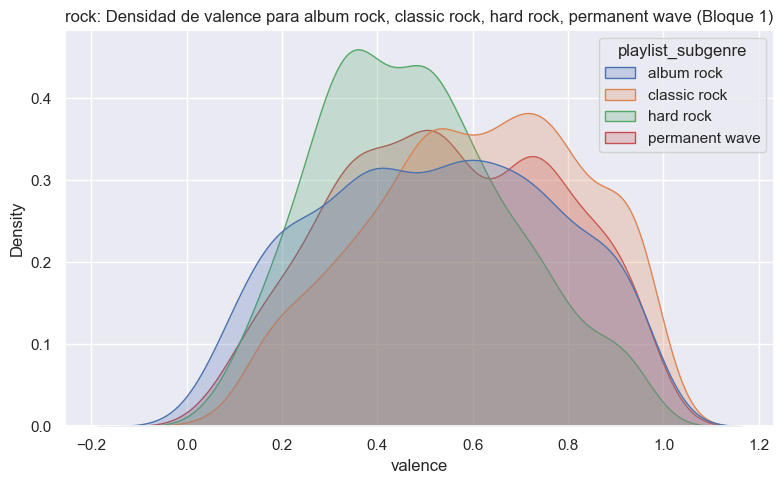

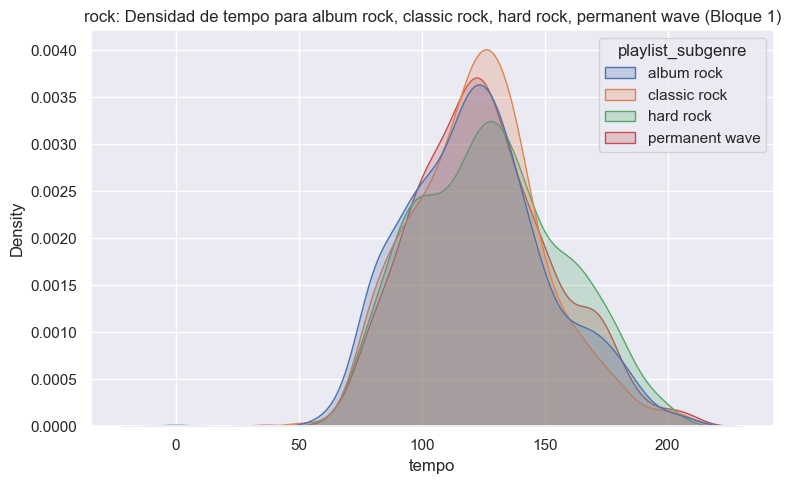

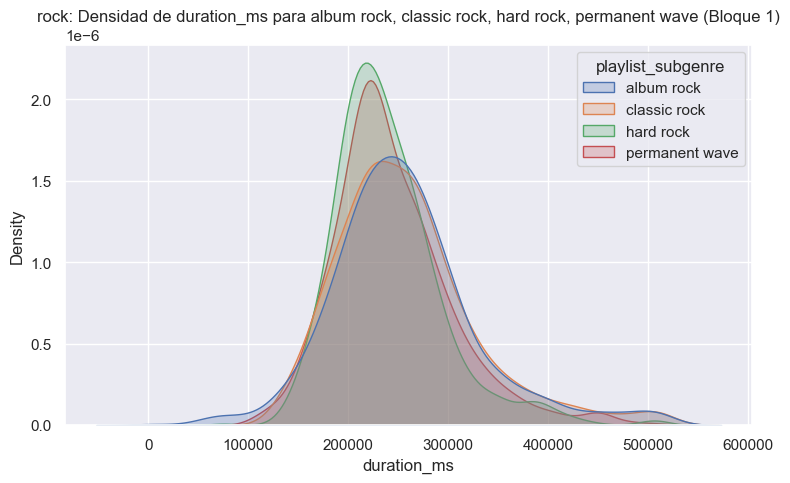

In [136]:
max_samples = 949  

balanced_data = (
    musicFeatureData
    .groupby('playlist_subgenre', group_keys=False)
    .apply(lambda x: x.sample(n=min(len(x), max_samples), random_state=42))
)

print(balanced_data['playlist_subgenre'].value_counts())

genre_groups = balanced_data.groupby('playlist_genre')['playlist_subgenre'].unique()

for genre, subgenres in genre_groups.items():
    subgenre_blocks = [subgenres[i:i+5] for i in range(0, len(subgenres), 5)]
    
    for block_idx, subgenre_block in enumerate(subgenre_blocks):
        subset = balanced_data[balanced_data['playlist_subgenre'].isin(subgenre_block)]
        
        for column in numerical_data.columns:
            plt.figure(figsize=(8, 5))
            sns.kdeplot(data=subset, x=column, hue='playlist_subgenre', fill=True)
            plt.title(f'{genre}: Densidad de {column} para {", ".join(subgenre_block)} (Bloque {block_idx + 1})')
            plt.tight_layout()
            plt.show()

In [137]:
genre_groups = balanced_data.groupby('playlist_genre')['playlist_subgenre'].unique()



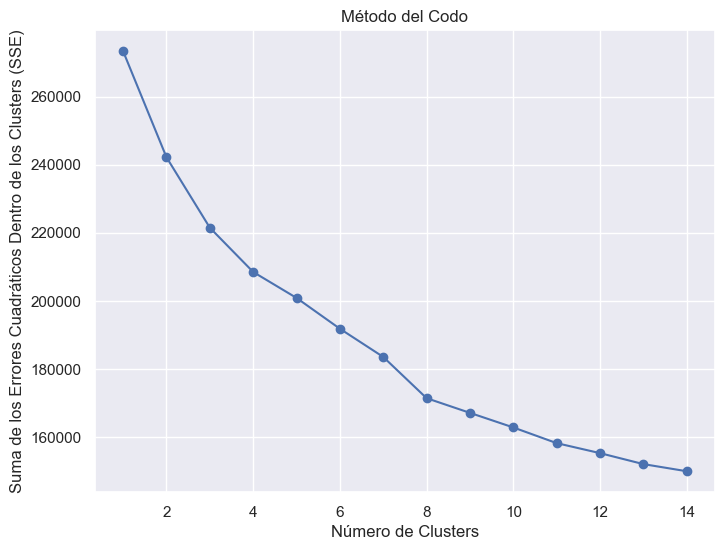

In [138]:
label_encoder = LabelEncoder()

max_samples = 949  

balanced_data = (
    musicFeatureData
    .groupby('playlist_subgenre', group_keys=False)
    .apply(lambda x: x.sample(n=min(len(x), max_samples), random_state=42))
)

balanced_data['playlist_subgenre_encoded'] = label_encoder.fit_transform(balanced_data['playlist_subgenre'])


features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'playlist_subgenre_encoded']

X = balanced_data[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

sse = []
k_range = range(1, 15)


for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit_predict(X_scaled)
    sse.append(kmeans.inertia_) 

plt.figure(figsize=(8, 6))
plt.plot(k_range, sse, marker='o')
plt.title('Método del Codo')
plt.xlabel('Número de Clusters')
plt.ylabel('Suma de los Errores Cuadráticos Dentro de los Clusters (SSE)')
plt.show()   

Centros de los clusters:
    danceability    energy       key  loudness      mode  speechiness  \
0     -0.562397 -1.857838  0.029348 -1.554871  0.091241    -0.313987   
1      0.519412  0.205002  0.339652  0.300814 -1.145960    -0.185321   
2      0.501619  0.364733 -0.196326  0.387967  0.872631    -0.230593   
3     -0.058520 -0.930781 -0.195051 -0.821060  0.318394    -0.411650   
4     -1.026439  0.704962 -0.027466  0.537096  0.084312    -0.318251   
5      0.392797 -0.270129  0.051096 -0.110077 -0.149593     2.286265   
6     -0.310057  0.431330 -0.007524  0.224557 -0.021387     0.080126   
7      0.015790  0.459600 -0.024515 -0.067076 -0.030355    -0.341177   

   acousticness  instrumentalness  liveness   valence     tempo  \
0      2.413281          0.404695 -0.254941 -0.603060 -0.282822   
1     -0.124593         -0.296254 -0.213218  0.467500 -0.170283   
2     -0.196337         -0.311337 -0.206810  0.672160 -0.158422   
3      0.126242         -0.286507 -0.294706 -0.401116 -0.

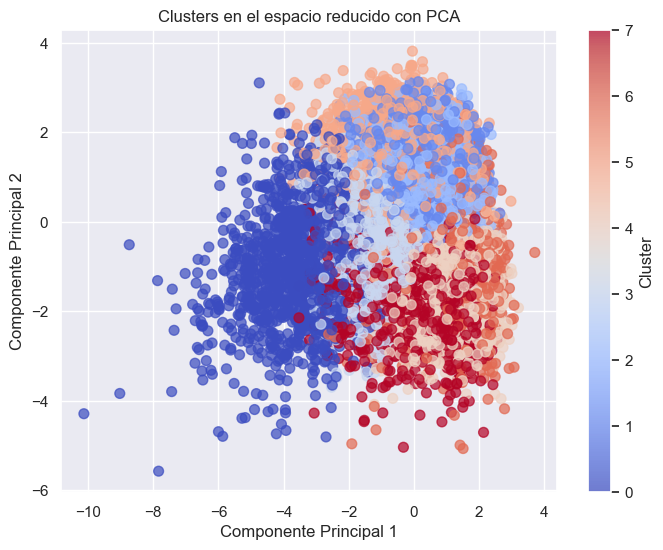

In [139]:
kmeans = KMeans(n_clusters=8, random_state=42)
balanced_data['cluster'] = kmeans.fit_predict(X_scaled)
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features)
print("Centros de los clusters:\n", cluster_centers)

pca = PCA(n_components=2)  
X_pca = pca.fit_transform(X_scaled)


plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=balanced_data['cluster'], cmap='coolwarm', s=50, alpha=0.7)
plt.title('Clusters en el espacio reducido con PCA')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.colorbar(label='Cluster')
plt.show()

In [140]:
target = 'playlist_subgenre_encoded'
X = balanced_data[features]
y = balanced_data[target]

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [141]:
y_pred = rf_classifier.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"MSE: {mse}")
print(f"R²: {r2}")

Accuracy: 0.949217034977316
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       261
           1       0.99      0.99      0.99       267
           2       0.98      0.99      0.98       298
           3       0.96      0.93      0.95       305
           4       0.95      0.97      0.96       284
           5       0.95      0.94      0.94       281
           6       0.96      0.95      0.95       297
           7       0.94      0.94      0.94       267
           8       0.96      0.95      0.96       304
           9       0.85      0.92      0.88       277
          10       0.92      0.92      0.92       303
          11       0.89      0.87      0.88       275
          12       0.91      0.92      0.92       276
          13       0.95      0.93      0.94       281
          14       0.97      0.95      0.96       291
          15       0.88      0.96      0.92       295
          16       0.87      

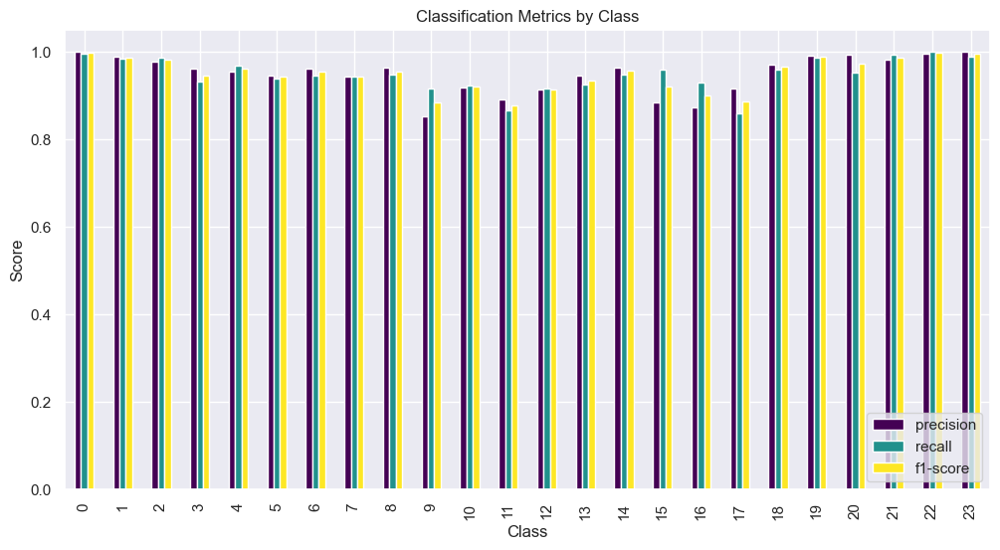

In [142]:

report = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report).transpose()

metrics = ['precision', 'recall', 'f1-score']
report_df[metrics].iloc[:-3].plot(kind='bar', figsize=(12, 6), colormap='viridis')
plt.title("Classification Metrics by Class")
plt.ylabel("Score")
plt.xlabel("Class")
plt.legend(loc='lower right')
plt.show()

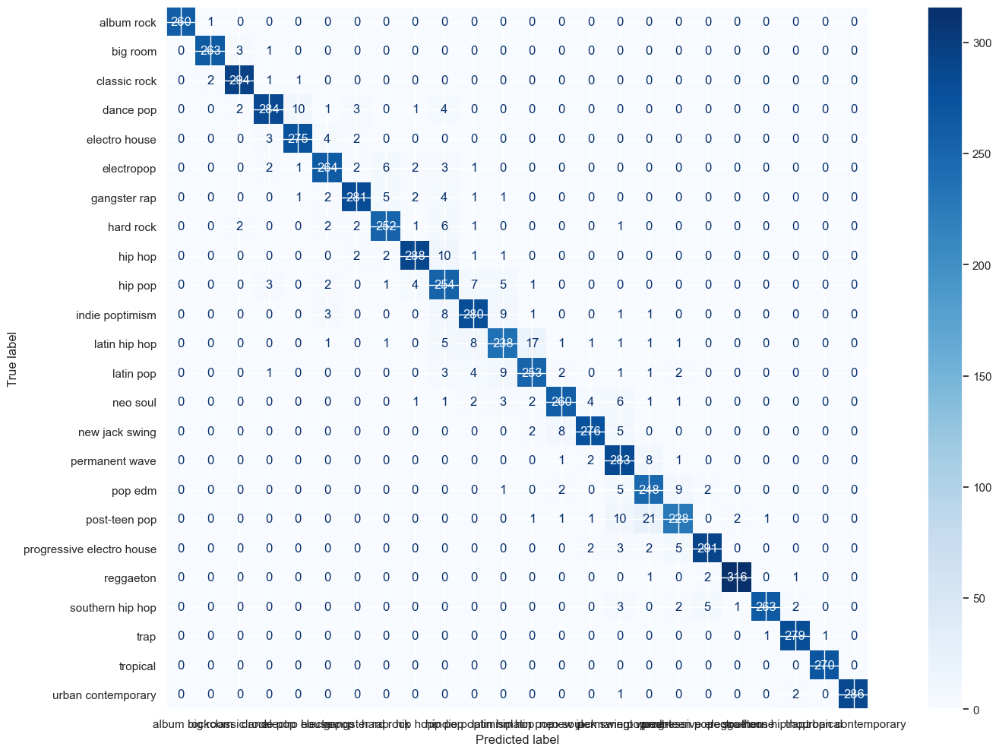

In [143]:
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=label_encoder.classes_)
disp.plot(cmap='Blues')
plt.show()

In [144]:
features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'playlist_subgenre_encoded']

random_row = balanced_data.sample(n=1)
nombre = random_row['track_name'].values[0]
nombreSubgenre = random_row['playlist_subgenre'].values[0]
print(nombre)
print(nombreSubgenre)

inputSong = random_row[features]

print(inputSong)



Amanda Lear
electropop
      danceability  energy  key  loudness  mode  speechiness  acousticness  \
3187         0.526   0.909    3    -3.328     1       0.0347       0.00894   

      instrumentalness  liveness  valence    tempo  playlist_subgenre_encoded  
3187           0.00302     0.106     0.32  129.967                          5  


In [145]:

input_song_scaled = scaler.transform(inputSong)
predicted_subgenre = rf_classifier.predict(input_song_scaled)

predicted_subgenre_name = label_encoder.inverse_transform(predicted_subgenre)

print(f'Predicted subgenre: {predicted_subgenre}, Name: {predicted_subgenre_name}')

Predicted subgenre: [5], Name: ['electropop']


In [146]:
joblib.dump(rf_classifier, 'random_forest_model_Partial_recommender.pkl')
joblib.dump(scaler, 'scaler.pkl')
joblib.dump(label_encoder, 'label_encoder.pkl')

['label_encoder.pkl']

# Se usa un modelo preentrenado con google colab para aprovechar la capacidad de computo

In [147]:
model = DistilBertForSequenceClassification.from_pretrained(r'C:\Users\david\OneDrive\Escritorio\DAVID\ECIJG\GELM\proyectoFinal\LyricsModel')
tokenizer = DistilBertTokenizer.from_pretrained(r'C:\Users\david\OneDrive\Escritorio\DAVID\ECIJG\GELM\proyectoFinal\LyricsModel')
label_encoderLyrics = joblib.load(r'C:\Users\david\OneDrive\Escritorio\DAVID\ECIJG\GELM\proyectoFinal\LyricsModel\label_encoder_Lyrics.pkl')

In [148]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

def predict_topic_from_lyrics(song_lyrics, model, tokenizer):
    inputs = tokenizer(song_lyrics, return_tensors="pt", truncation=True, padding=True, max_length=512).to(device)

    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits
    predicted_class = torch.argmax(logits, dim=1).item()
    
    return predicted_class

In [149]:
lyrics_and_topics = list(zip(musicLyricsData['lyrics'].values, musicLyricsData['topic'].values))

balanced_data['lyrics'], balanced_data['topic'] = zip(*[random.choice(lyrics_and_topics) for _ in range(len(balanced_data))])


In [150]:
balanced_data.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,playlist_subgenre_encoded,cluster,lyrics,topic
11284,4g9TfQAiEN6lDNRJJsiU9T,Sorry,Guns N' Roses,49,0suNLpB9xraAv1FcdlITjQ,Chinese Democracy,2008-01-01,This Is Guns N' Roses,37i9dQZF1DX74DnfGTwugU,rock,...,0.0702,0.000064,0.1150,0.209,147.519,374187,0,4,grand slam moment hand hold costly bargain los...,world/life
12085,1qP7KmHJbzvV8KsFPhW8wY,Seven Seas Of Rhye - Remastered 2011,Queen,38,0NouBnbXRJKFWzm9LwCW0K,Queen II (2011 Remaster),1974-03-08,The Queen - La Discografia Completa,3E88dLx4fgFYY70gdGzdnB,rock,...,0.1220,0.016800,0.2530,0.421,126.894,168973,0,4,tell people follow follow tell people free fol...,violence
11666,0MYNeFsKpzBHwrJGfWZysV,Locomotive Breath,Jethro Tull,60,0NGM3Ftwjw0dLNpAowmz3x,Aqualung (Special Edition),1971-03-19,Progressive Rock / Metal - Rock /Metal Progre...,7GhTpb4eOp6403Bmgqz3db,rock,...,0.4170,0.011000,0.0559,0.352,124.551,266013,0,3,know need wouldn stay away know desire soul wo...,sadness
12300,6cVHu0HmKo4oEOSOqooTa3,La Negra Tomasa - Bilongo - Versión Tropical,Caifanes,63,7oNSmwtmqu8EvnD3cv2HOr,Caifanes,1988-05-15,Caifanes La Historia,3kysJw7lvVwSoOaL0KyW94,rock,...,0.2340,0.311000,0.2740,0.694,174.441,472400,0,4,dippy dippy hear original shit twelvepack tell...,obscene
12127,2N5mE30V04xDvsX2caDLlj,Sleeping On The Sidewalk - Remastered 2011,Queen,35,7tB40pGzj6Tg0HePj2jWZt,News Of The World (2011 Remaster),1977-10-28,The Queen - La Discografia Completa,3E88dLx4fgFYY70gdGzdnB,rock,...,0.4660,0.000279,0.3870,0.644,129.947,186080,0,2,instrumental open hear lonesome loser beat que...,sadness


In [ ]:
def recommend_songs(input_song, input_song_lyrics, rf_classifier, scaler, label_encoder, label_encoderLyrics, dataset, model, tokenizer, num_recommendations=5):
    features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 
                'instrumentalness', 'liveness', 'valence', 'tempo', 'playlist_subgenre_encoded']
    
    input_features = input_song[features]
    
    input_song_scaled = scaler.transform(input_features)
    
    predicted_subgenre = rf_classifier.predict(input_song_scaled)
    predicted_subgenre_name = label_encoder.inverse_transform(predicted_subgenre)
    
    print(f"Predicted Subgenre: {predicted_subgenre_name[0]}")
    
    filtered_songs = dataset[dataset['playlist_subgenre'] == predicted_subgenre_name[0]]
    
    predicted_topic = predict_topic_from_lyrics(input_song_lyrics, model, tokenizer)
    predicted_topic_name = label_encoderLyrics.inverse_transform([predicted_topic])[0]
    print(f"Predicted topic:{predicted_topic_name}")
    
    if predicted_topic_name in filtered_songs['topic'].values:
        filtered_songs = filtered_songs[filtered_songs['topic'] == predicted_topic_name]
    else:
        print(f"No matching topic found for the predicted topic: {predicted_topic}. Using subgenre filtering only.")
    
    recommended_songs = filtered_songs  
    
    recommendations = recommended_songs.head(num_recommendations)
    
    return recommendations[['track_name', 'playlist_subgenre', 'duration_ms', 'topic']]


random_row = balanced_data.sample(n=1)
nombre = random_row['track_name'].values[0]
nombreSubgenre = random_row['playlist_subgenre'].values[0]
print(nombre)
print(nombreSubgenre)

inputSongLyrics = random_row['lyrics'].values[0]
inputSong = random_row[features]

print(inputSong)


recommendations = recommend_songs(inputSong, inputSongLyrics, rf_classifier, scaler, label_encoder, label_encoderLyrics ,balanced_data, model, tokenizer)
print(recommendations)

The Universe Is Ours
big room
       danceability  energy  key  loudness  mode  speechiness  acousticness  \
29041         0.398   0.906    6    -3.521     0       0.0538       0.00677   

       instrumentalness  liveness  valence   tempo  playlist_subgenre_encoded  
29041            0.0111     0.372    0.266  127.97                          1  
Predicted Subgenre: big room
Predicted topic:sadness
                                   track_name playlist_subgenre  duration_ms  \
28561                              Five Hours          big room       326888   
28350                                      Ox          big room       175385   
29182  Tough Love - Tiësto Remix / Radio Edit          big room       193187   
28509                                Big Bird          big room       156942   
28429                      Won't Stop Rocking          big room       187500   

         topic  
28561  sadness  
28350  sadness  
29182  sadness  
28509  sadness  
28429  sadness  
